In [4]:
## Import geospatial libraries 
from osgeo import gdal, ogr
import geopandas as gpd
import shapefile as shp 
import rioxarray as rxr
import rasterio as rio

## Import other libraries
import os
import matplotlib.pyplot as plt
import numpy as np
import glob
from patchify import patchify
import random
from tkinter import Tcl

In [5]:
def invisible_ax(ax):
    """
    Removes axes labels and tick marks for simple patch-pair visualizations
    """
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    return ax 

def plot_tiled_data(img_arr, plot = 'all'):
    """
    INPUTS
    img_arr = 128 x 128 x 5 image tile 
    plot = 'all' to plot 5 separate images, 'rgb' to plot RGB and LST images 
    """
    if plot == 'rgb':   # Plot RGB and LST images (transposed)    
        fig, (ax1, ax2) = plt.subplots(1,2)
        ax1 = invisible_ax(ax1)
        ax2 = invisible_ax(ax2)
        
        r = img_arr[0,:,:]
        r = (r/(r.max()/255.0)).astype(int)
        g = img_arr[1,:,:]
        g = (g/(g.max()/255.0)).astype(int)
        b = img_arr[2,:,:]
        b = (b/(b.max()/255.0)).astype(int)
        rgb_img = np.stack((r,g,b)).T
        ax1.imshow(rgb_img)
        ax1.set_title('RGB')
        ax2.imshow(img_arr[4,:,:].T, cmap='Spectral_r')  ## Need to map to specific bounds?
        ax2.set_title('LST')
        plt.show()
    else:    # Plot Red, Green, Blue, NIR, LST images 
        fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5)
        ax1 = invisible_ax(ax1)
        ax2 = invisible_ax(ax2)
        ax3 = invisible_ax(ax3)
        ax4 = invisible_ax(ax4)
        ax5 = invisible_ax(ax5)
        
        ax1.imshow(img_arr[0,:,:], cmap='Reds')
        ax1.set_title('R')
        ax2.imshow(img_arr[1,:,:], cmap='Greens')
        ax2.set_title('G')
        ax3.imshow(img_arr[2,:,:], cmap='Blues')
        ax3.set_title('B')
        ax4.imshow(img_arr[3,:,:], cmap='Greys')
        ax4.set_title('NIR')
        ax5.imshow(img_arr[4,:,:], cmap='jet')
        ax5.set_title('LST')
        plt.show()

In [17]:
### ONLY NEEDS TO BE RUN ONCE ###
## Crop stacked ECOSTRESS + Planet GeoTiffs to buffered ROIs to create training data set ###

loc_key_list = ['austin', 'chicago', 'dc', 'la', 'boulder']
season_key_list = ['spring', 'summer', 'fall', 'winter']

for loc_key in loc_key_list: # Iterate through target cities 
    
    # Import shapefiles from target city 
    shp_path_base = '/Volumes/pangan/Shapefiles/'
    shp_path = os.path.join(shp_path_base, loc_key + '_split/')
    shp_list = glob.glob(os.path.join(shp_path, '*.shp'))
    
    for season_key in season_key_list: # Iterate through seasons
        print(loc_key, season_key)
        print('# of shapefiles:', len(shp_list))
        
        # Get stacked LST + RGB GeoTiff from target city & season
        tif_path = '/Volumes/pangan/Merged/Full/'
        tif_name = glob.glob(tif_path + '*' + loc_key + '_' + season_key + '*.tif')

        # Crop to unique split shapefiles 
        path = '/Volumes/pangan/Training_Data_Full/'
        counter = 0 
        for shp in shp_list:
            output_name = str(counter) + '_training_' + os.path.basename(tif_name[0])
            output_path = os.path.join(path, output_name)
            crop_tif = gdal.Warp(output_path, 
                            tif_name[0], 
                            cutlineDSName = str(shp), 
                            cropToCutline = True, 
                            dstNodata = 0)
            counter += 1

austin spring
# of shapefiles: 20
austin summer
# of shapefiles: 20
austin fall
# of shapefiles: 20
austin winter
# of shapefiles: 20
chicago spring
# of shapefiles: 20
chicago summer
# of shapefiles: 20
chicago fall
# of shapefiles: 20
chicago winter
# of shapefiles: 20
dc spring
# of shapefiles: 10
dc summer
# of shapefiles: 10
dc fall
# of shapefiles: 10
dc winter
# of shapefiles: 10
la spring
# of shapefiles: 20
la summer
# of shapefiles: 20
la fall
# of shapefiles: 20
la winter
# of shapefiles: 20
boulder spring
# of shapefiles: 10
boulder summer
# of shapefiles: 10
boulder fall
# of shapefiles: 10
boulder winter
# of shapefiles: 10


IndexError: list index out of range

In [19]:
### ONLY NEEDS TO BE RUN ONCE ###

## Remove any files that were flagged to be deleted after tiling (e.g., from cloud corruption)
path_del_128 = '/Volumes/pangan/del_128.txt' # del_128.txt contains list of corrupted tif files
path_train_128 = '/Volumes/pangan/Training_Data_Full/Retiled_128/'

del_128 = open(path_del_128, 'r')
del_128_list = del_128.readlines()

for file in del_128_list:
    full_file = os.path.join(path_train_128, file).strip()
    print('Deleted', file)
#     os.remove(full_file)


Deleted 1_test_128_austin_spring_LST_4_1.tif



FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/pangan/Training_Data_Full/retile/test_128/LST/1_test_128_austin_spring_LST_4_1.tif'

In [8]:
### ONLY NEEDS TO BE RUN ONCE ###

# Iterate through all tifs
# If .tif name is in the list flagged for edge, add EDGE = 1 
# If .tif name is not in edge list, add EDGE = 0 

loc_key_list = ['austin', 'la', 'chicago', 'dc', 'boulder']
season_key_list = ['spring', 'summer', 'fall', 'winter']

# Read in .txt file containing info on which tifs are edge
tif_path = '/Volumes/pangan/Training_Data_Full/Retiled_128/'
edge_path = '/Volumes/pangan/edge_128.txt' # edge_128.txt contains list of edge tif files 
edge = open(edge_path, 'r')
edge_list = edge.readlines()

# Strip extra new line characters 
edge_list_clean = []
for edge in edge_list:
    edge_list_clean.append(edge.strip())
    
edge_counter = 0
counter = 0

# Go through all tifs and update metadata to add EDGE metadata field    
for loc_key in loc_key_list: # Iterate through target cities 
    for season_key in season_key_list: # Iterate through seasons 
        print(loc_key, season_key)
        tif_list = glob.glob(tif_path + '*' + loc_key + '_' + season_key + '*.tif')
        tif_list = Tcl().call('lsort', '-dict', tif_list) # Sort tif_list by name & number
        for tif in tif_list:
            counter += 1 
            tif_name = os.path.basename(tif)
            if tif_name in edge_list_clean: # If tif has been flagged as an edge, update metadata
                edge_counter += 1
                !gdal_edit.py -mo EDGE=1 '/Volumes/pangan/Training_Data_Full/Retiled_128/{tif_name}'
            else:
                !gdal_edit.py -mo EDGE=0 '/Volumes/pangan/Training_Data_Full/Retiled_128/{tif_name}'

print(100*edge_counter/counter) # What fraction of training data is edge?

austin spring
austin summer
austin fall
austin winter
la spring
la summer
la fall
la winter
chicago spring
chicago summer
chicago fall
chicago winter
dc spring
dc summer
dc fall
dc winter
boulder spring
boulder summer
boulder fall
boulder winter


0_training_boulder_spring_stacked_1_1.tif


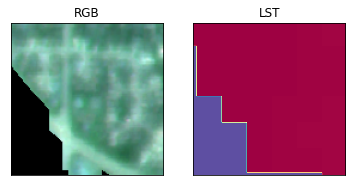

0_training_boulder_spring_stacked_1_2.tif


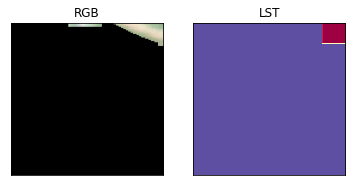

0_training_boulder_spring_stacked_1_3.tif


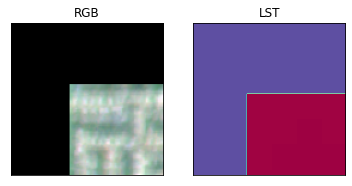

0_training_boulder_spring_stacked_1_4.tif


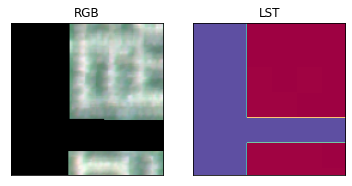

0_training_boulder_spring_stacked_1_5.tif


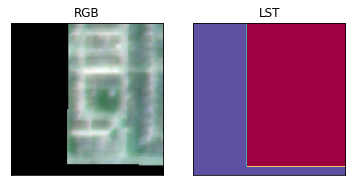

0_training_boulder_spring_stacked_2_1.tif


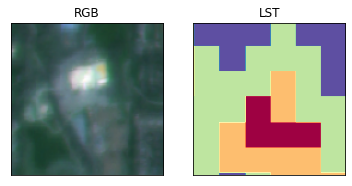

0_training_boulder_spring_stacked_2_2.tif


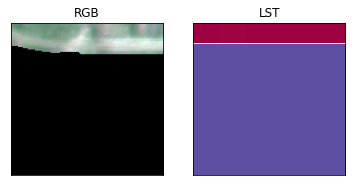

0_training_boulder_spring_stacked_2_4.tif


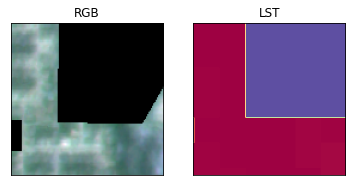

0_training_boulder_spring_stacked_2_5.tif


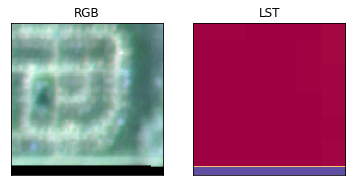

0_training_boulder_spring_stacked_2_6.tif


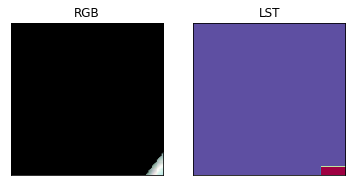

0_training_boulder_spring_stacked_3_1.tif


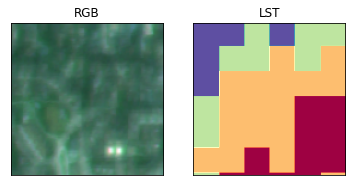

0_training_boulder_spring_stacked_3_2.tif


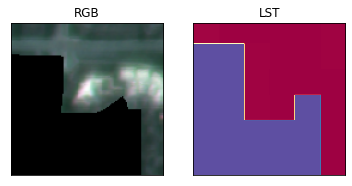

0_training_boulder_spring_stacked_3_3.tif


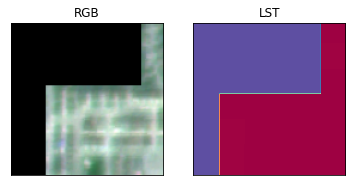

0_training_boulder_spring_stacked_3_4.tif


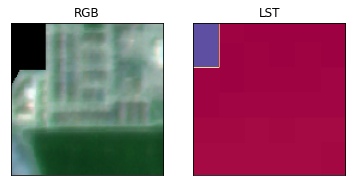

0_training_boulder_spring_stacked_3_5.tif


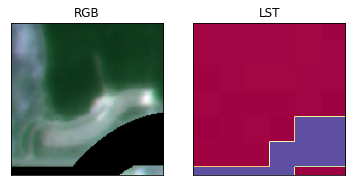

0_training_boulder_spring_stacked_3_6.tif


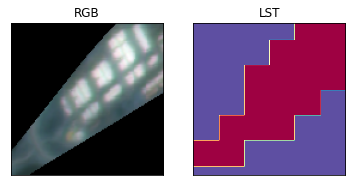

0_training_boulder_spring_stacked_4_1.tif


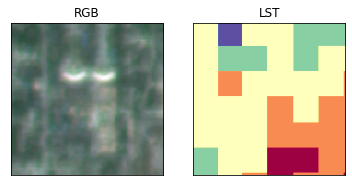

0_training_boulder_spring_stacked_4_2.tif


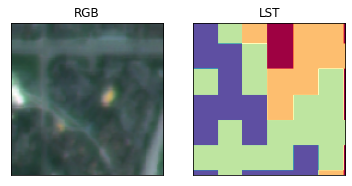

0_training_boulder_spring_stacked_4_3.tif


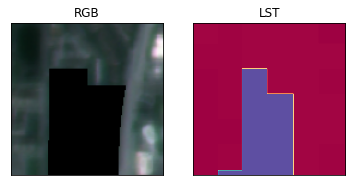

0_training_boulder_spring_stacked_4_4.tif


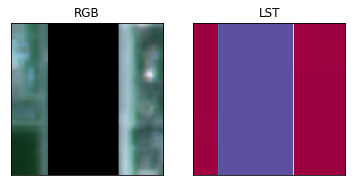

0_training_boulder_spring_stacked_4_5.tif


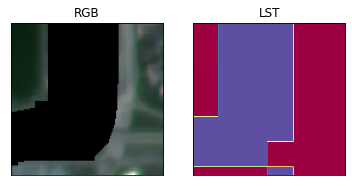

0_training_boulder_spring_stacked_4_6.tif


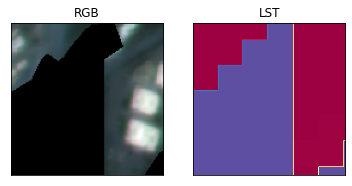

1_training_boulder_spring_stacked_1_1.tif


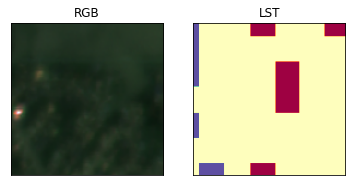

1_training_boulder_spring_stacked_1_2.tif


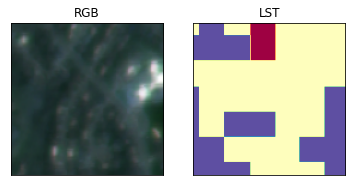

1_training_boulder_spring_stacked_1_3.tif


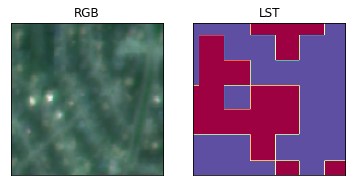

1_training_boulder_spring_stacked_1_4.tif


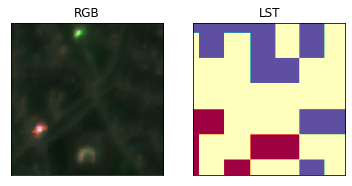

1_training_boulder_spring_stacked_1_5.tif


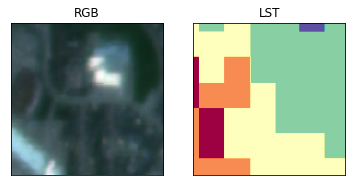

1_training_boulder_spring_stacked_1_6.tif


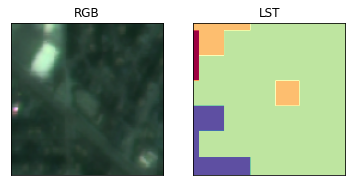

1_training_boulder_spring_stacked_2_1.tif


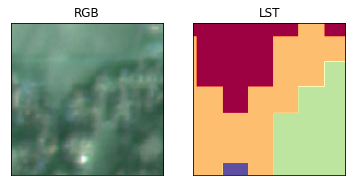

1_training_boulder_spring_stacked_2_2.tif


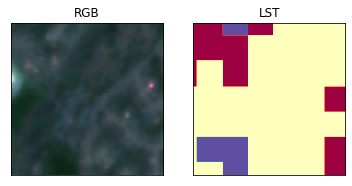

1_training_boulder_spring_stacked_2_3.tif


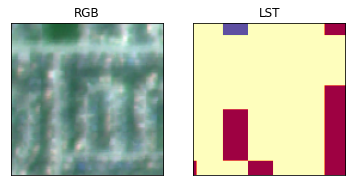

1_training_boulder_spring_stacked_2_4.tif


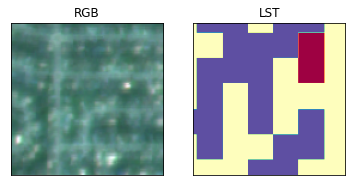

1_training_boulder_spring_stacked_2_5.tif


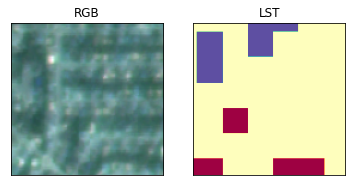

1_training_boulder_spring_stacked_2_6.tif


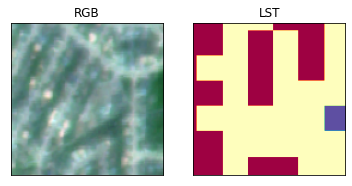

1_training_boulder_spring_stacked_3_1.tif


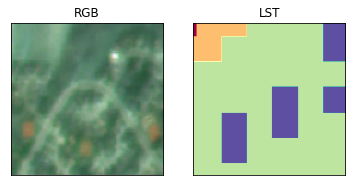

1_training_boulder_spring_stacked_3_2.tif


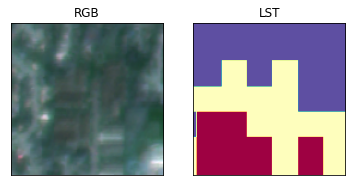

1_training_boulder_spring_stacked_3_3.tif


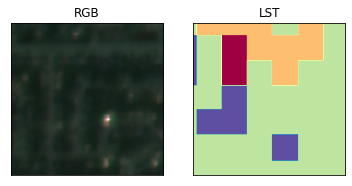

1_training_boulder_spring_stacked_3_4.tif


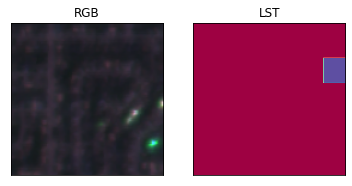

1_training_boulder_spring_stacked_3_5.tif


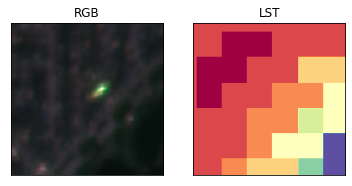

1_training_boulder_spring_stacked_3_6.tif


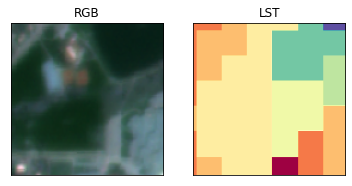

1_training_boulder_spring_stacked_4_1.tif


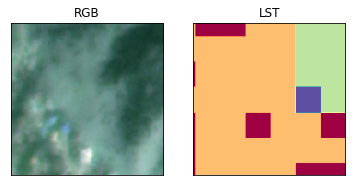

1_training_boulder_spring_stacked_4_2.tif


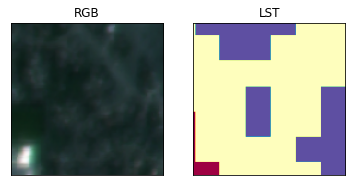

1_training_boulder_spring_stacked_4_3.tif


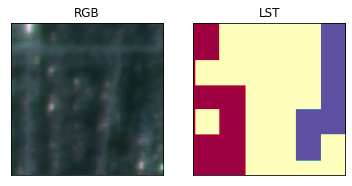

1_training_boulder_spring_stacked_4_4.tif


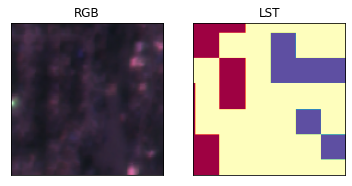

1_training_boulder_spring_stacked_4_5.tif


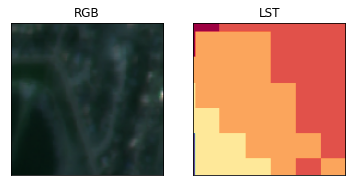

1_training_boulder_spring_stacked_4_6.tif


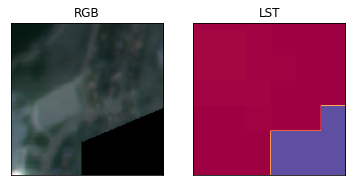

/var/folders/bf/n82l0hrx2ll8_3snb7lzjsfc0000gn/T/ipykernel_33427/554342852.py:21: RuntimeWarning: invalid value encountered in true_divide
  r = (r/(r.max()/255.0)).astype(int)
/var/folders/bf/n82l0hrx2ll8_3snb7lzjsfc0000gn/T/ipykernel_33427/554342852.py:23: RuntimeWarning: invalid value encountered in true_divide
  g = (g/(g.max()/255.0)).astype(int)
/var/folders/bf/n82l0hrx2ll8_3snb7lzjsfc0000gn/T/ipykernel_33427/554342852.py:25: RuntimeWarning: invalid value encountered in true_divide
  b = (b/(b.max()/255.0)).astype(int)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_spring_stacked_1_1.tif


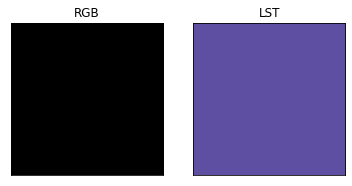

2_training_boulder_spring_stacked_1_2.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


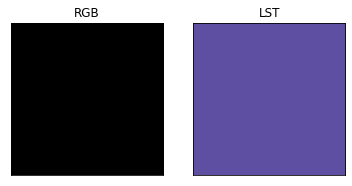

2_training_boulder_spring_stacked_1_3.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


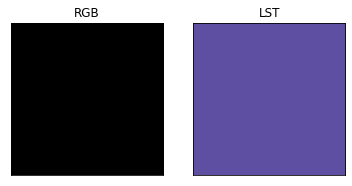

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_spring_stacked_1_4.tif


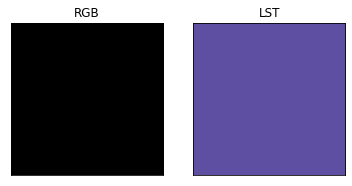

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_spring_stacked_1_5.tif


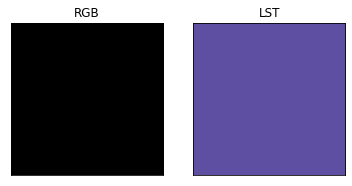

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_spring_stacked_1_6.tif


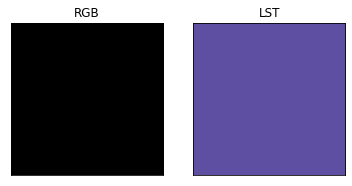

2_training_boulder_spring_stacked_2_1.tif


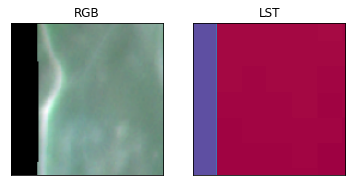

2_training_boulder_spring_stacked_2_2.tif


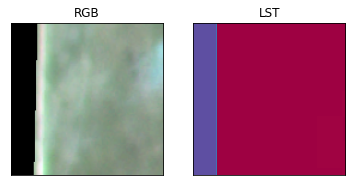

2_training_boulder_spring_stacked_2_3.tif


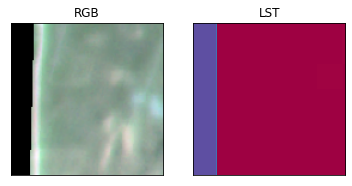

2_training_boulder_spring_stacked_2_4.tif


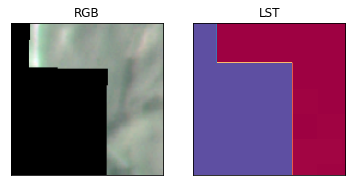

2_training_boulder_spring_stacked_2_5.tif


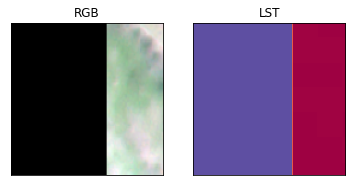

2_training_boulder_spring_stacked_2_6.tif


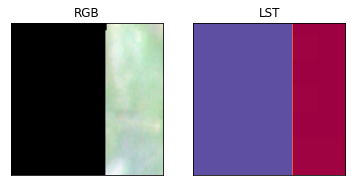

2_training_boulder_spring_stacked_3_1.tif


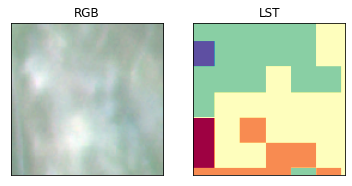

2_training_boulder_spring_stacked_3_2.tif


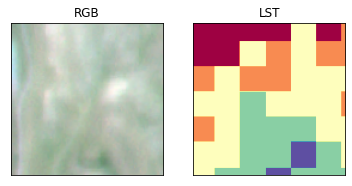

2_training_boulder_spring_stacked_3_3.tif


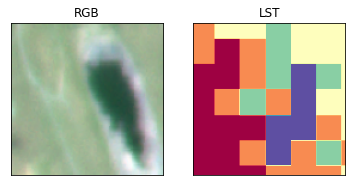

2_training_boulder_spring_stacked_3_4.tif


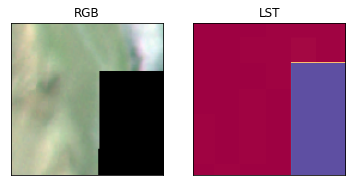

2_training_boulder_spring_stacked_3_5.tif


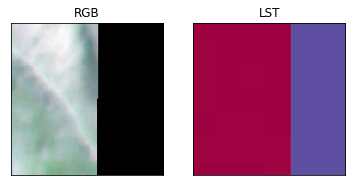

2_training_boulder_spring_stacked_3_6.tif


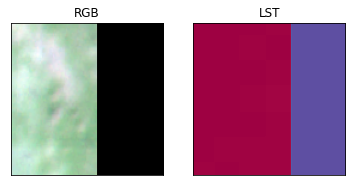

2_training_boulder_spring_stacked_4_1.tif


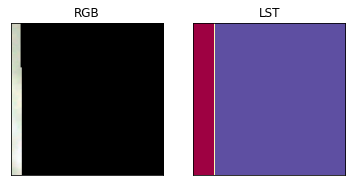

2_training_boulder_spring_stacked_4_2.tif


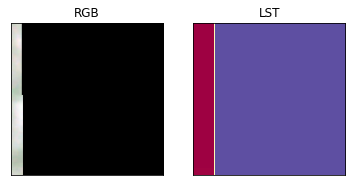

2_training_boulder_spring_stacked_4_3.tif


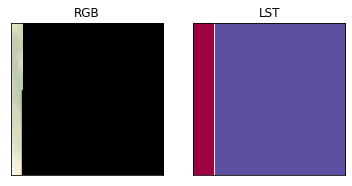

2_training_boulder_spring_stacked_4_4.tif


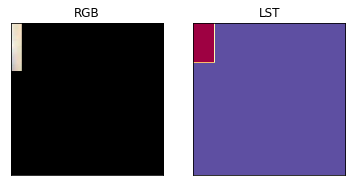

2_training_boulder_spring_stacked_4_5.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


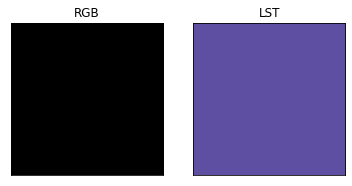

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_spring_stacked_4_6.tif


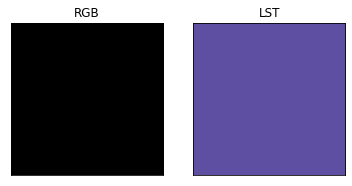

3_training_boulder_spring_stacked_1_1.tif


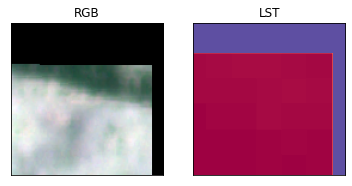

3_training_boulder_spring_stacked_1_2.tif


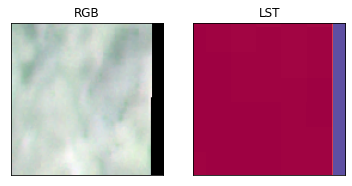

3_training_boulder_spring_stacked_1_3.tif


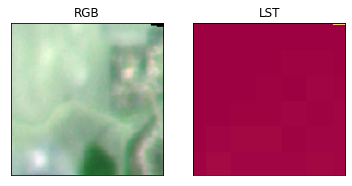

3_training_boulder_spring_stacked_1_4.tif


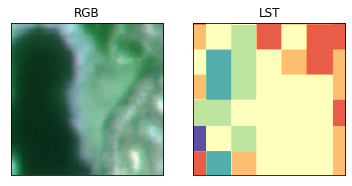

3_training_boulder_spring_stacked_1_5.tif


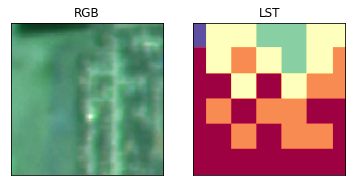

3_training_boulder_spring_stacked_1_6.tif


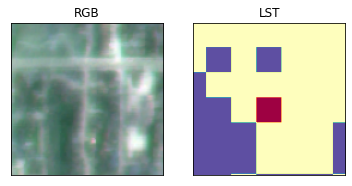

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_spring_stacked_2_1.tif


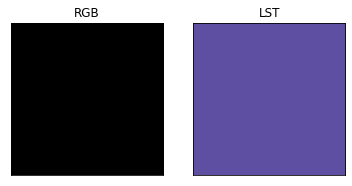

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_spring_stacked_2_2.tif


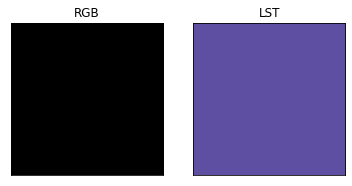

3_training_boulder_spring_stacked_2_3.tif


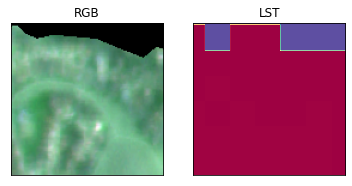

3_training_boulder_spring_stacked_2_4.tif


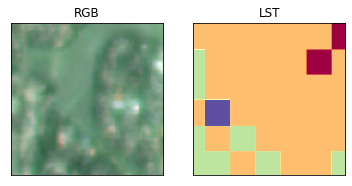

3_training_boulder_spring_stacked_2_5.tif


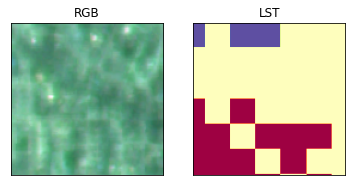

3_training_boulder_spring_stacked_2_6.tif


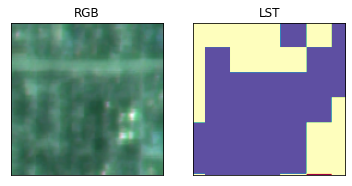

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_spring_stacked_3_1.tif


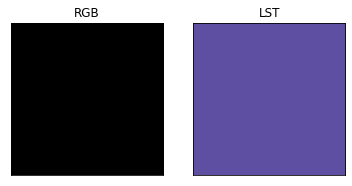

3_training_boulder_spring_stacked_3_2.tif


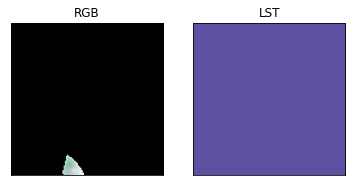

3_training_boulder_spring_stacked_3_3.tif


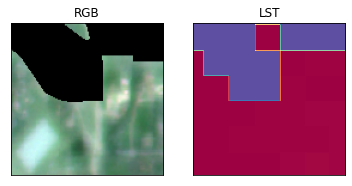

3_training_boulder_spring_stacked_3_4.tif


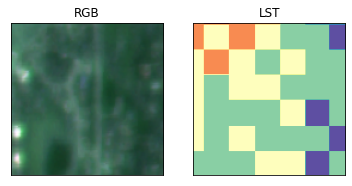

3_training_boulder_spring_stacked_3_5.tif


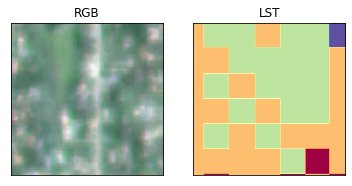

3_training_boulder_spring_stacked_3_6.tif


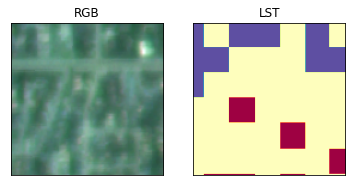

3_training_boulder_spring_stacked_4_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


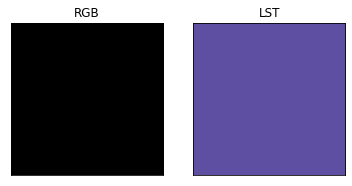

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_spring_stacked_4_2.tif


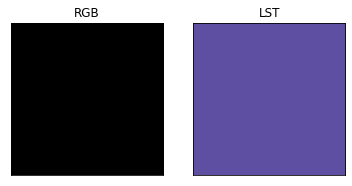

3_training_boulder_spring_stacked_4_3.tif


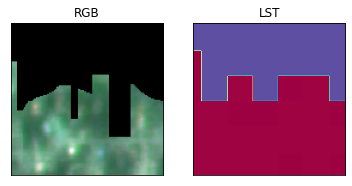

3_training_boulder_spring_stacked_4_4.tif


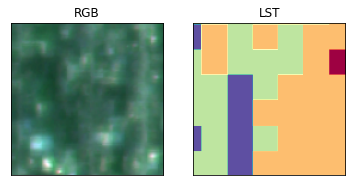

3_training_boulder_spring_stacked_4_5.tif


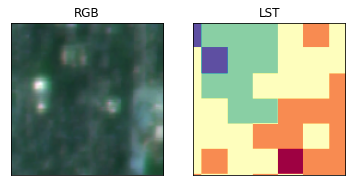

3_training_boulder_spring_stacked_4_6.tif


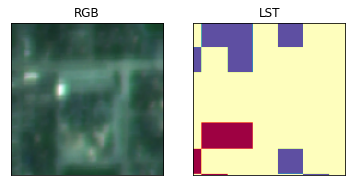

4_training_boulder_spring_stacked_1_1.tif


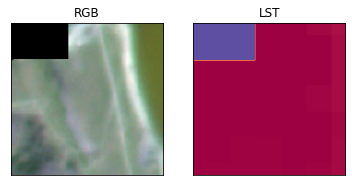

4_training_boulder_spring_stacked_1_2.tif


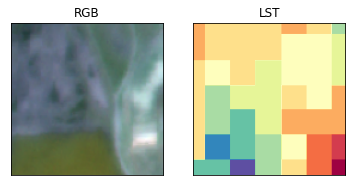

4_training_boulder_spring_stacked_1_3.tif


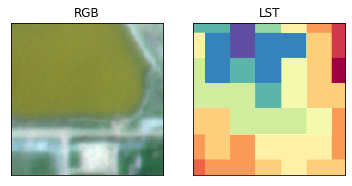

4_training_boulder_spring_stacked_1_4.tif


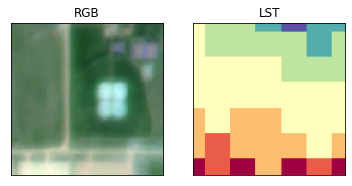

4_training_boulder_spring_stacked_1_5.tif


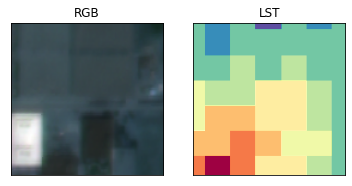

4_training_boulder_spring_stacked_1_6.tif


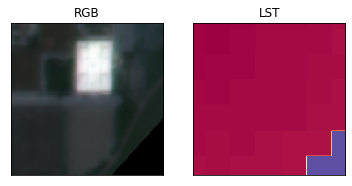

4_training_boulder_spring_stacked_2_1.tif


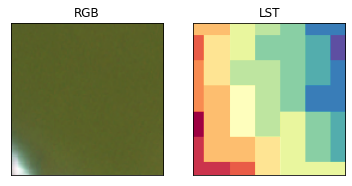

4_training_boulder_spring_stacked_2_2.tif


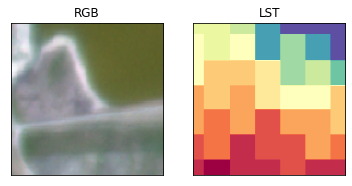

4_training_boulder_spring_stacked_2_3.tif


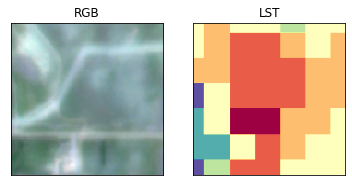

4_training_boulder_spring_stacked_2_4.tif


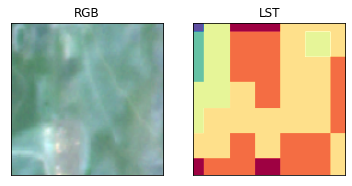

4_training_boulder_spring_stacked_2_5.tif


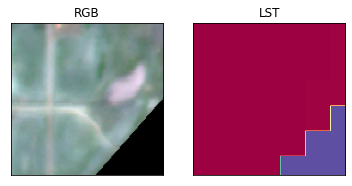

4_training_boulder_spring_stacked_2_6.tif


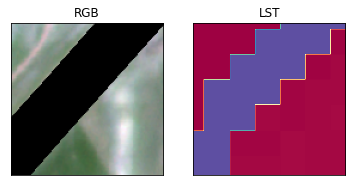

4_training_boulder_spring_stacked_3_1.tif


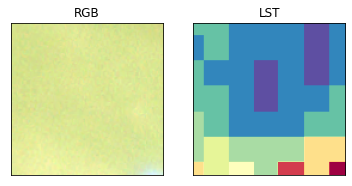

4_training_boulder_spring_stacked_3_2.tif


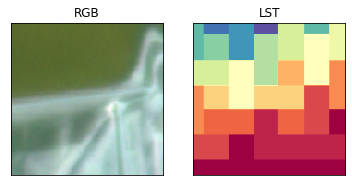

4_training_boulder_spring_stacked_3_3.tif


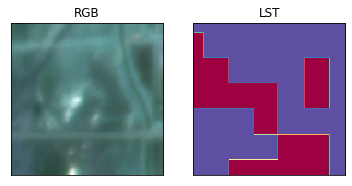

4_training_boulder_spring_stacked_3_4.tif


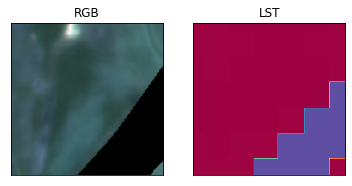

4_training_boulder_spring_stacked_3_5.tif


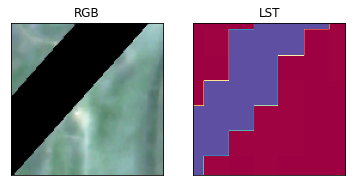

4_training_boulder_spring_stacked_3_6.tif


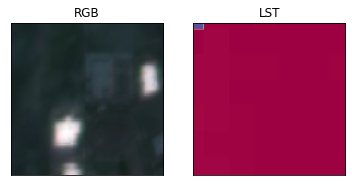

4_training_boulder_spring_stacked_4_1.tif


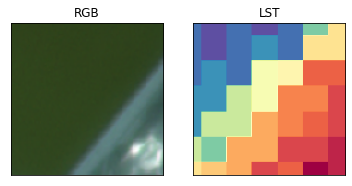

4_training_boulder_spring_stacked_4_2.tif


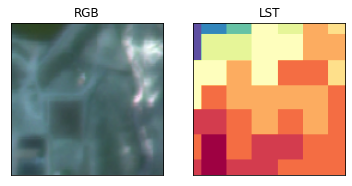

4_training_boulder_spring_stacked_4_3.tif


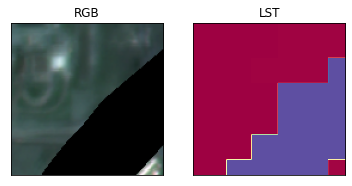

4_training_boulder_spring_stacked_4_4.tif


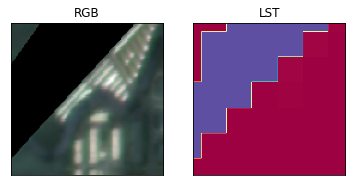

4_training_boulder_spring_stacked_4_5.tif


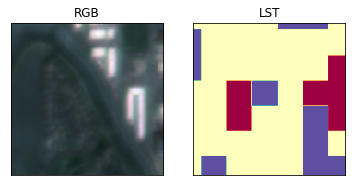

4_training_boulder_spring_stacked_4_6.tif


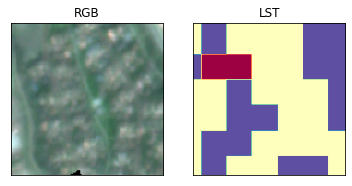

5_training_boulder_spring_stacked_1_1.tif


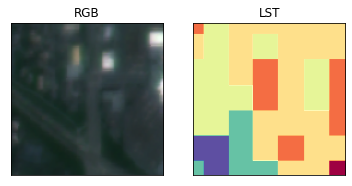

5_training_boulder_spring_stacked_1_2.tif


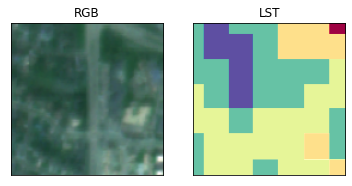

5_training_boulder_spring_stacked_1_3.tif


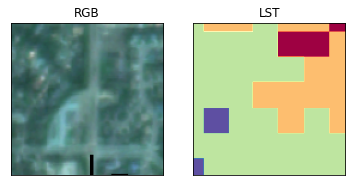

5_training_boulder_spring_stacked_1_4.tif


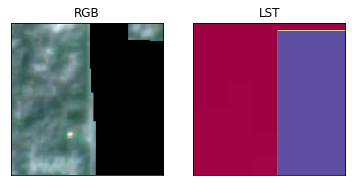

5_training_boulder_spring_stacked_1_5.tif


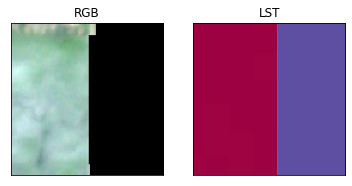

5_training_boulder_spring_stacked_1_6.tif


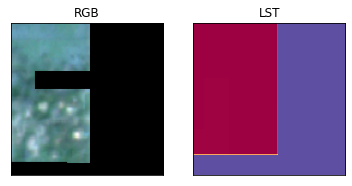

5_training_boulder_spring_stacked_2_1.tif


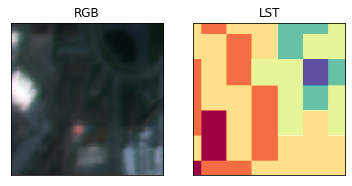

5_training_boulder_spring_stacked_2_2.tif


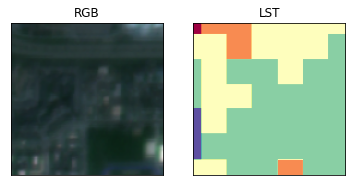

5_training_boulder_spring_stacked_2_3.tif


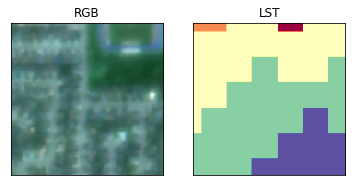

5_training_boulder_spring_stacked_2_4.tif


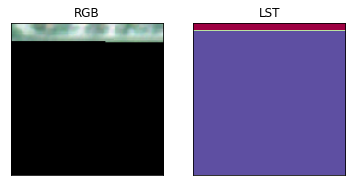

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5_training_boulder_spring_stacked_2_5.tif


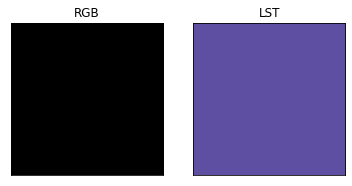

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5_training_boulder_spring_stacked_2_6.tif


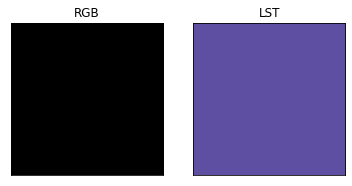

5_training_boulder_spring_stacked_3_1.tif


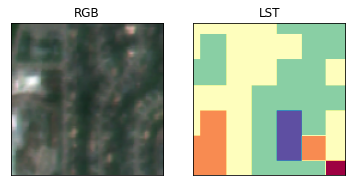

5_training_boulder_spring_stacked_3_2.tif


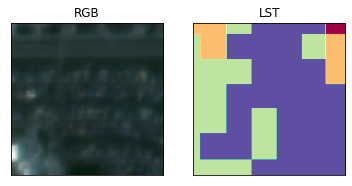

5_training_boulder_spring_stacked_3_3.tif


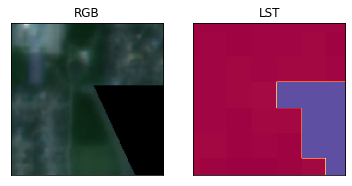

5_training_boulder_spring_stacked_3_4.tif


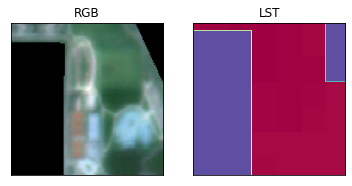

5_training_boulder_spring_stacked_3_5.tif


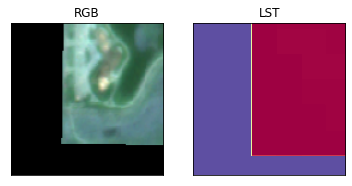

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5_training_boulder_spring_stacked_3_6.tif


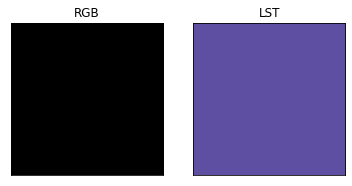

5_training_boulder_spring_stacked_4_1.tif


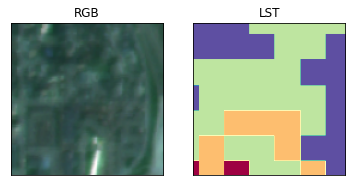

5_training_boulder_spring_stacked_4_2.tif


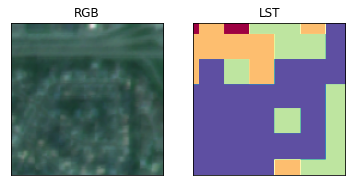

5_training_boulder_spring_stacked_4_3.tif


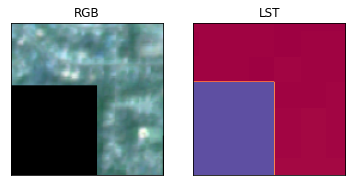

5_training_boulder_spring_stacked_4_4.tif


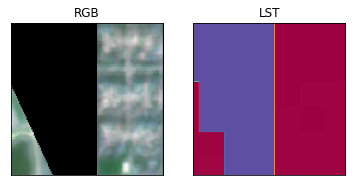

5_training_boulder_spring_stacked_4_5.tif


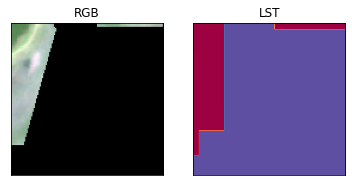

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5_training_boulder_spring_stacked_4_6.tif


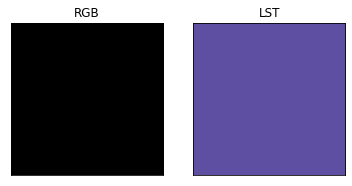

6_training_boulder_spring_stacked_1_1.tif


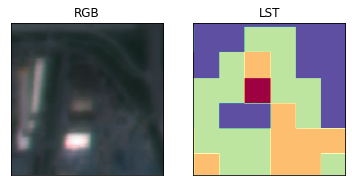

6_training_boulder_spring_stacked_1_2.tif


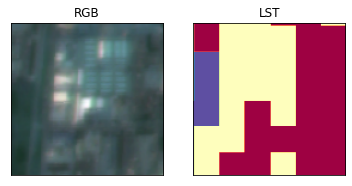

6_training_boulder_spring_stacked_1_3.tif


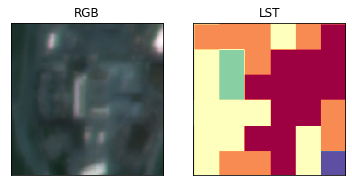

6_training_boulder_spring_stacked_1_4.tif


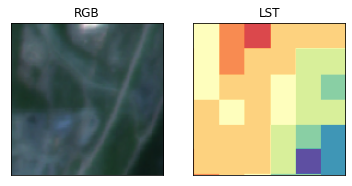

6_training_boulder_spring_stacked_1_5.tif


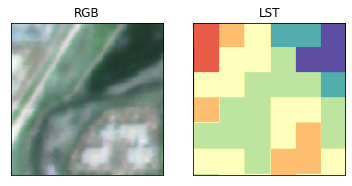

6_training_boulder_spring_stacked_1_6.tif


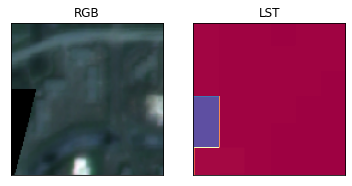

6_training_boulder_spring_stacked_2_1.tif


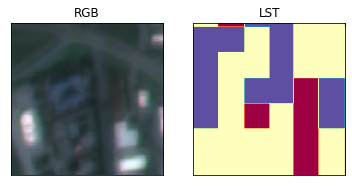

6_training_boulder_spring_stacked_2_2.tif


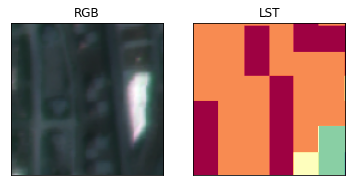

6_training_boulder_spring_stacked_2_3.tif


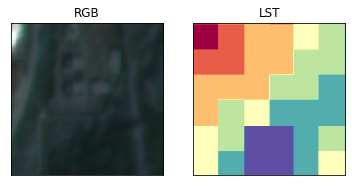

6_training_boulder_spring_stacked_2_4.tif


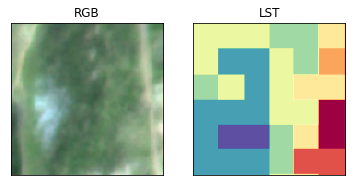

6_training_boulder_spring_stacked_2_5.tif


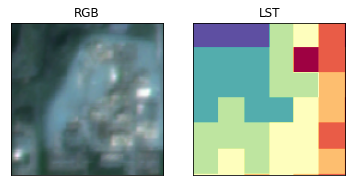

6_training_boulder_spring_stacked_2_6.tif


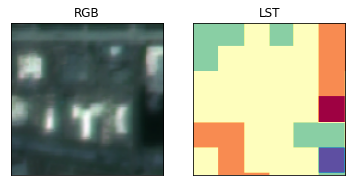

6_training_boulder_spring_stacked_3_1.tif


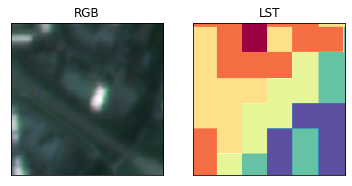

6_training_boulder_spring_stacked_3_2.tif


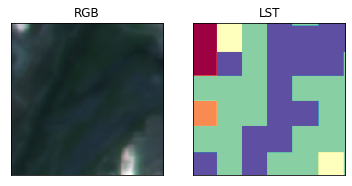

6_training_boulder_spring_stacked_3_3.tif


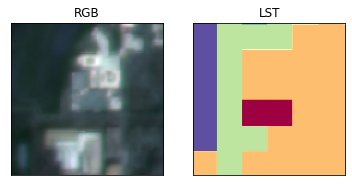

6_training_boulder_spring_stacked_3_4.tif


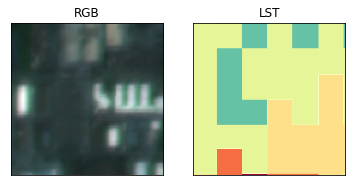

6_training_boulder_spring_stacked_3_5.tif


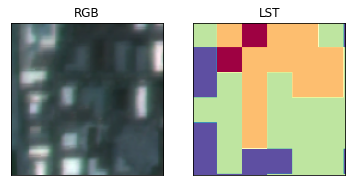

6_training_boulder_spring_stacked_3_6.tif


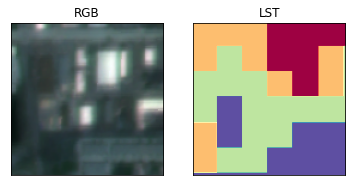

6_training_boulder_spring_stacked_4_1.tif


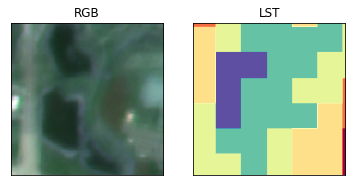

6_training_boulder_spring_stacked_4_2.tif


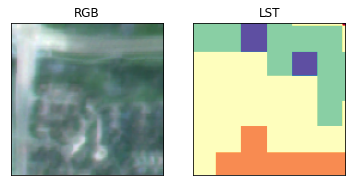

6_training_boulder_spring_stacked_4_3.tif


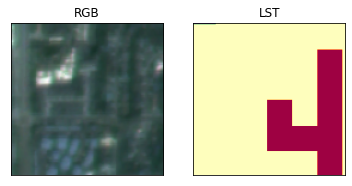

6_training_boulder_spring_stacked_4_4.tif


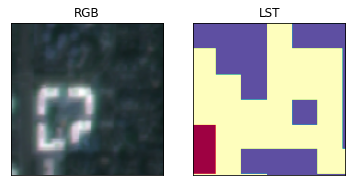

6_training_boulder_spring_stacked_4_5.tif


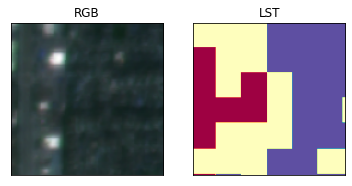

6_training_boulder_spring_stacked_4_6.tif


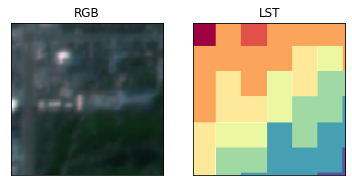

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7_training_boulder_spring_stacked_1_1.tif


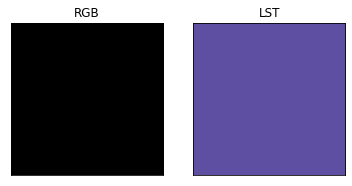

7_training_boulder_spring_stacked_1_2.tif


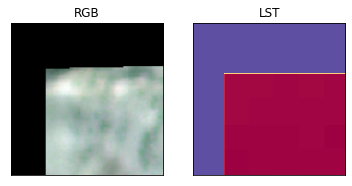

7_training_boulder_spring_stacked_1_3.tif


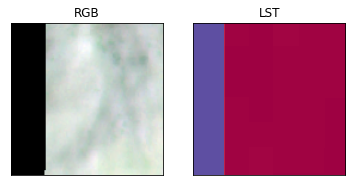

7_training_boulder_spring_stacked_1_4.tif


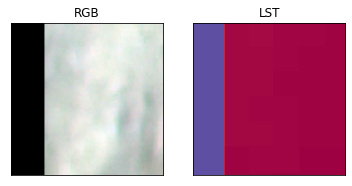

7_training_boulder_spring_stacked_1_5.tif


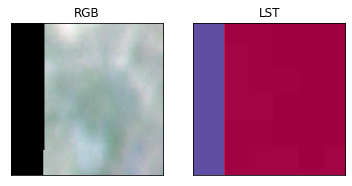

7_training_boulder_spring_stacked_1_6.tif


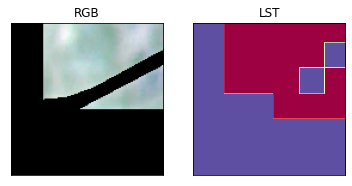

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7_training_boulder_spring_stacked_2_1.tif


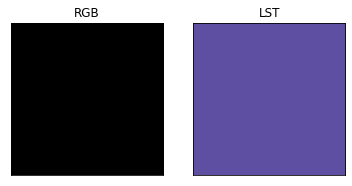

7_training_boulder_spring_stacked_2_2.tif


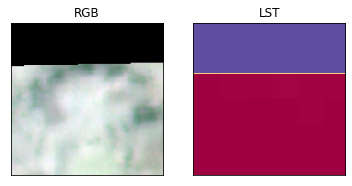

7_training_boulder_spring_stacked_2_3.tif


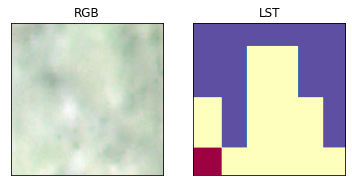

7_training_boulder_spring_stacked_2_4.tif


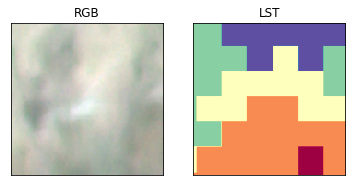

7_training_boulder_spring_stacked_2_5.tif


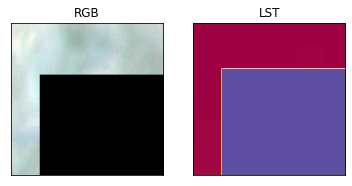

7_training_boulder_spring_stacked_2_6.tif


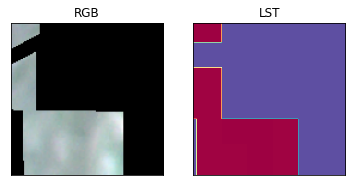

7_training_boulder_spring_stacked_3_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


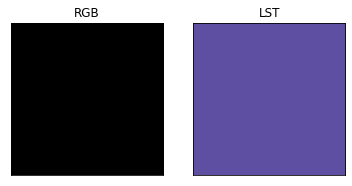

7_training_boulder_spring_stacked_3_2.tif


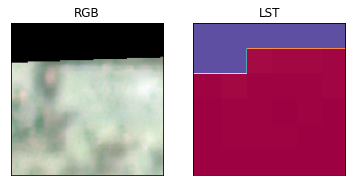

7_training_boulder_spring_stacked_3_3.tif


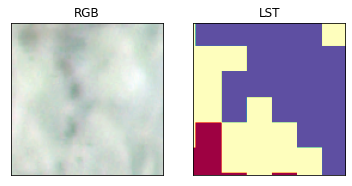

7_training_boulder_spring_stacked_3_4.tif


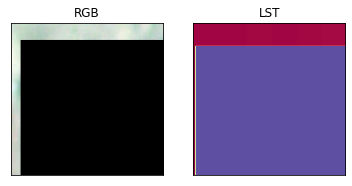

7_training_boulder_spring_stacked_3_5.tif


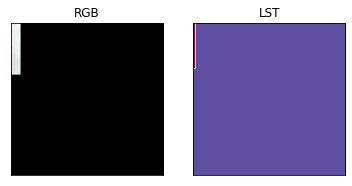

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7_training_boulder_spring_stacked_3_6.tif


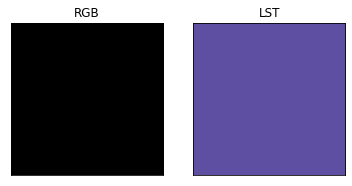

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7_training_boulder_spring_stacked_4_1.tif


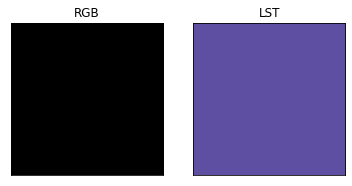

7_training_boulder_spring_stacked_4_2.tif


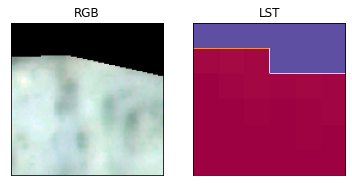

7_training_boulder_spring_stacked_4_3.tif


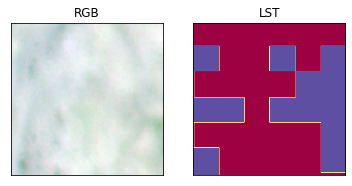

7_training_boulder_spring_stacked_4_4.tif


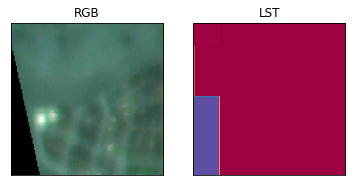

7_training_boulder_spring_stacked_4_5.tif


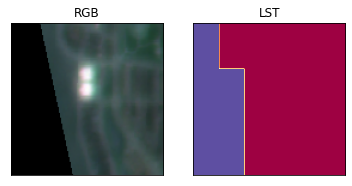

7_training_boulder_spring_stacked_4_6.tif


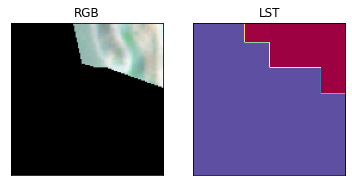

8_training_boulder_spring_stacked_1_1.tif


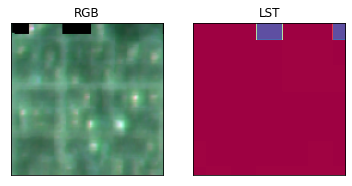

8_training_boulder_spring_stacked_1_2.tif


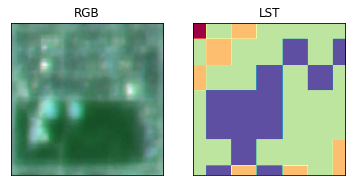

8_training_boulder_spring_stacked_1_3.tif


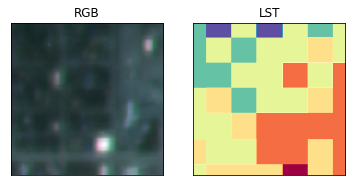

8_training_boulder_spring_stacked_1_4.tif


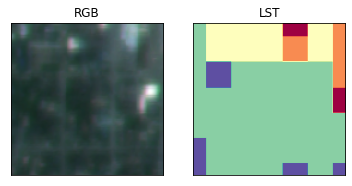

8_training_boulder_spring_stacked_1_5.tif


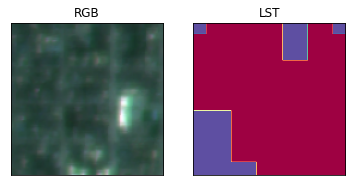

8_training_boulder_spring_stacked_1_6.tif


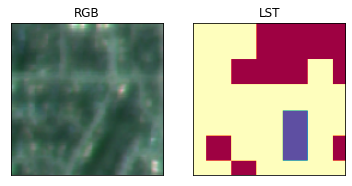

8_training_boulder_spring_stacked_2_1.tif


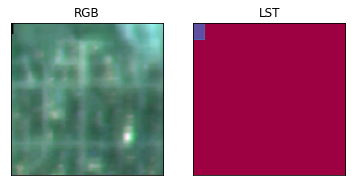

8_training_boulder_spring_stacked_2_2.tif


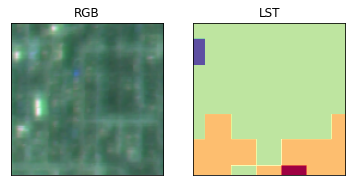

8_training_boulder_spring_stacked_2_3.tif


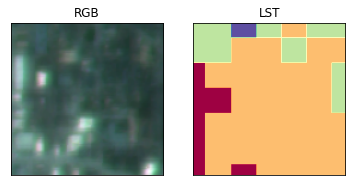

8_training_boulder_spring_stacked_2_4.tif


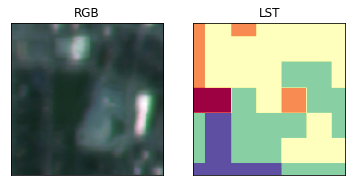

8_training_boulder_spring_stacked_2_5.tif


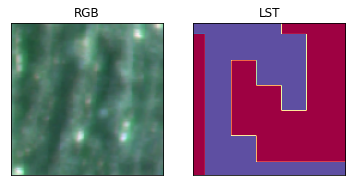

8_training_boulder_spring_stacked_2_6.tif


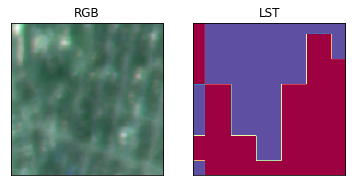

8_training_boulder_spring_stacked_3_1.tif


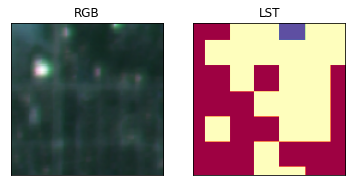

8_training_boulder_spring_stacked_3_2.tif


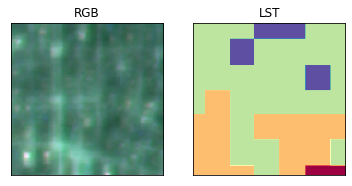

8_training_boulder_spring_stacked_3_3.tif


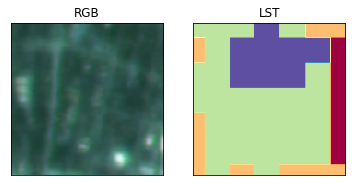

8_training_boulder_spring_stacked_3_4.tif


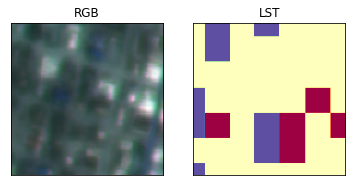

8_training_boulder_spring_stacked_3_5.tif


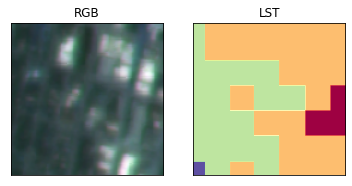

8_training_boulder_spring_stacked_3_6.tif


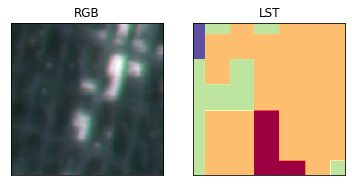

8_training_boulder_spring_stacked_4_1.tif


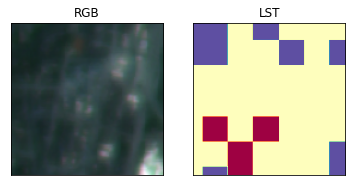

8_training_boulder_spring_stacked_4_2.tif


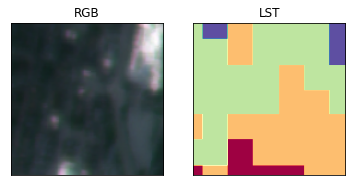

8_training_boulder_spring_stacked_4_3.tif


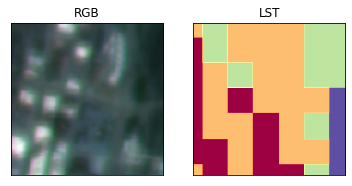

8_training_boulder_spring_stacked_4_4.tif


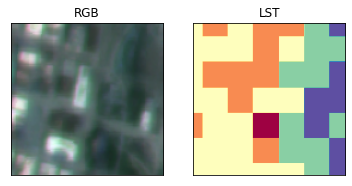

8_training_boulder_spring_stacked_4_5.tif


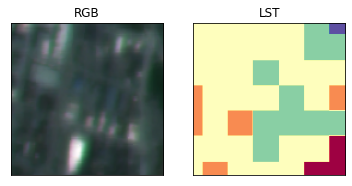

8_training_boulder_spring_stacked_4_6.tif


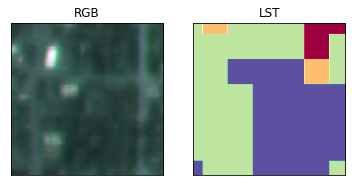

9_training_boulder_spring_stacked_1_1.tif


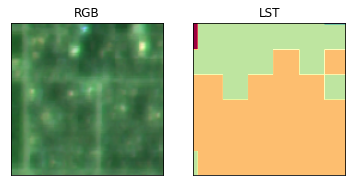

9_training_boulder_spring_stacked_1_2.tif


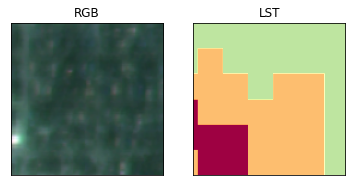

9_training_boulder_spring_stacked_1_3.tif


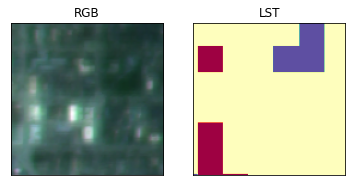

9_training_boulder_spring_stacked_1_4.tif


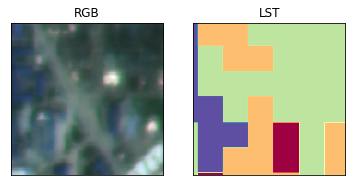

9_training_boulder_spring_stacked_1_5.tif


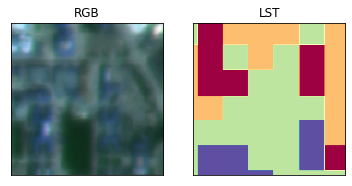

9_training_boulder_spring_stacked_1_6.tif


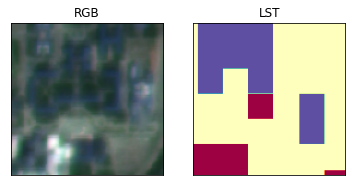

9_training_boulder_spring_stacked_2_1.tif


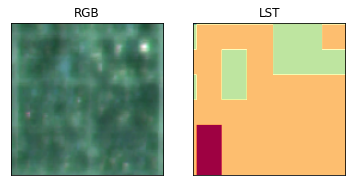

9_training_boulder_spring_stacked_2_2.tif


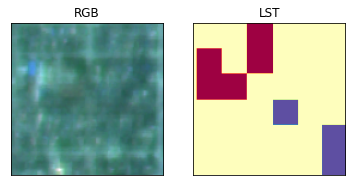

9_training_boulder_spring_stacked_2_3.tif


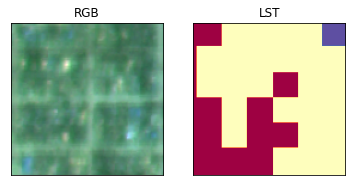

9_training_boulder_spring_stacked_2_4.tif


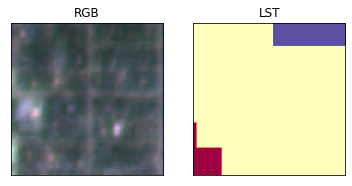

9_training_boulder_spring_stacked_2_5.tif


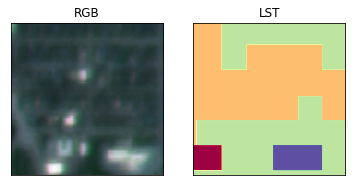

9_training_boulder_spring_stacked_2_6.tif


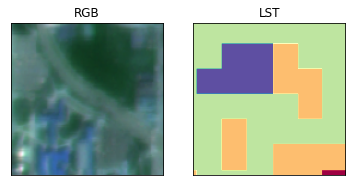

9_training_boulder_spring_stacked_3_1.tif


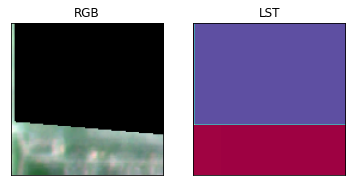

9_training_boulder_spring_stacked_3_2.tif


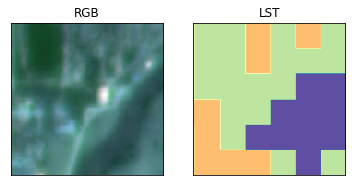

9_training_boulder_spring_stacked_3_3.tif


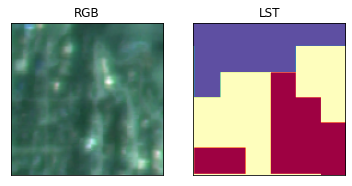

9_training_boulder_spring_stacked_3_4.tif


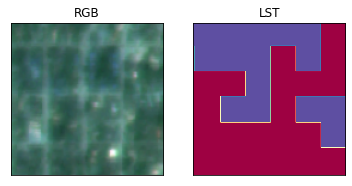

9_training_boulder_spring_stacked_3_5.tif


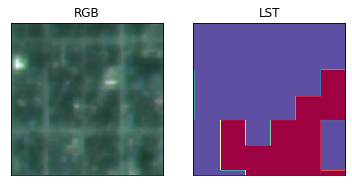

9_training_boulder_spring_stacked_3_6.tif


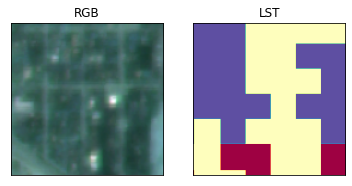

9_training_boulder_spring_stacked_4_1.tif


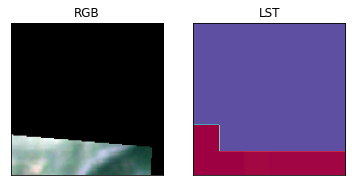

9_training_boulder_spring_stacked_4_2.tif


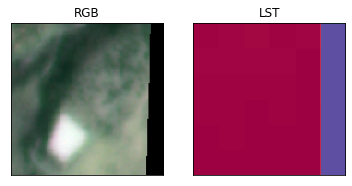

9_training_boulder_spring_stacked_4_3.tif


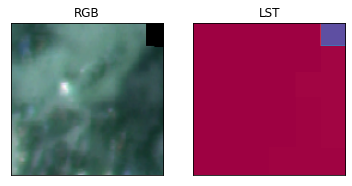

9_training_boulder_spring_stacked_4_4.tif


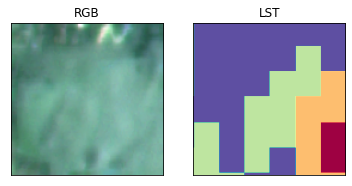

9_training_boulder_spring_stacked_4_5.tif


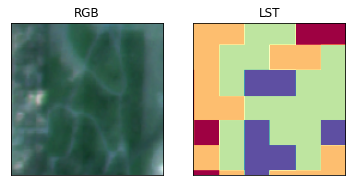

9_training_boulder_spring_stacked_4_6.tif


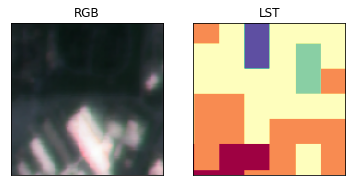

0_training_boulder_summer_stacked_1_1.tif


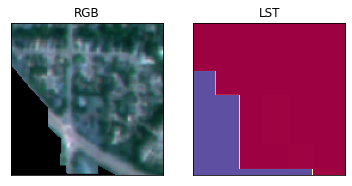

0_training_boulder_summer_stacked_1_2.tif


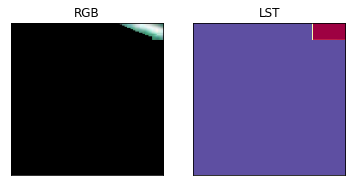

0_training_boulder_summer_stacked_1_3.tif


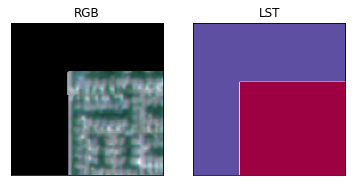

0_training_boulder_summer_stacked_1_4.tif


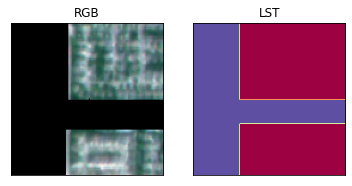

0_training_boulder_summer_stacked_1_5.tif


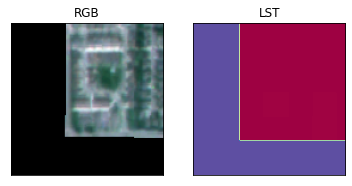

0_training_boulder_summer_stacked_2_1.tif


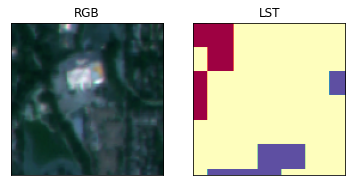

0_training_boulder_summer_stacked_2_2.tif


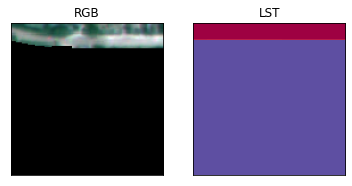

0_training_boulder_summer_stacked_2_3.tif


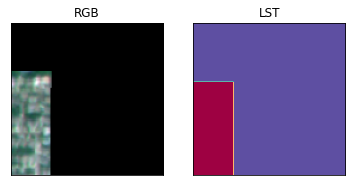

0_training_boulder_summer_stacked_2_4.tif


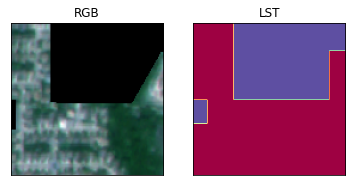

0_training_boulder_summer_stacked_2_5.tif


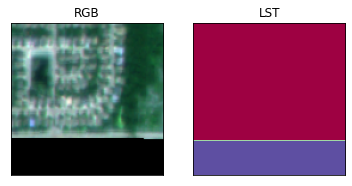

0_training_boulder_summer_stacked_3_1.tif


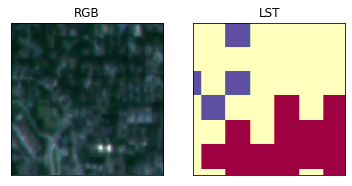

0_training_boulder_summer_stacked_3_2.tif


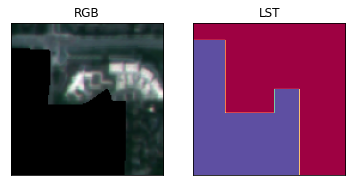

0_training_boulder_summer_stacked_3_3.tif


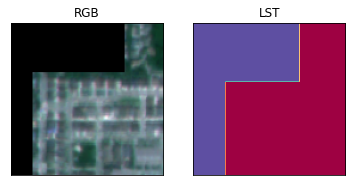

0_training_boulder_summer_stacked_3_4.tif


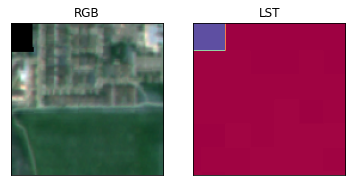

0_training_boulder_summer_stacked_3_5.tif


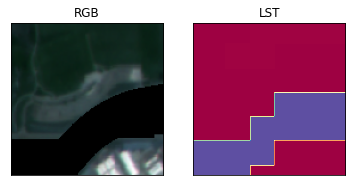

0_training_boulder_summer_stacked_4_1.tif


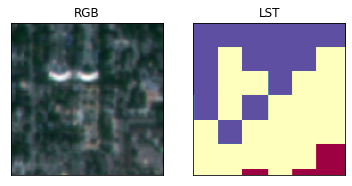

0_training_boulder_summer_stacked_4_2.tif


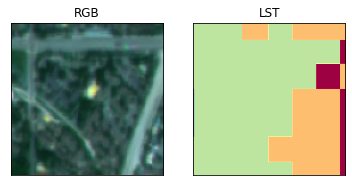

0_training_boulder_summer_stacked_4_3.tif


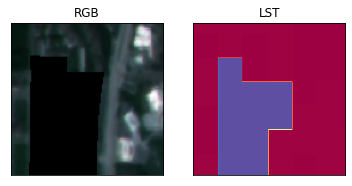

0_training_boulder_summer_stacked_4_4.tif


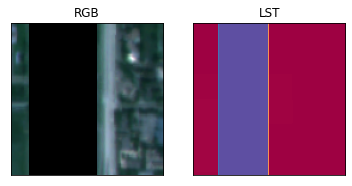

0_training_boulder_summer_stacked_4_5.tif


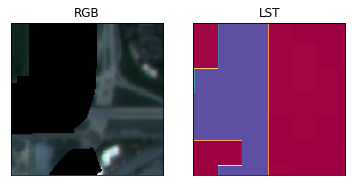

1_training_boulder_summer_stacked_1_1.tif


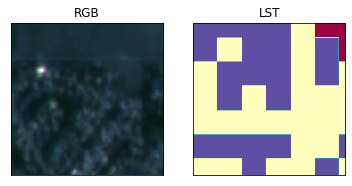

1_training_boulder_summer_stacked_1_2.tif


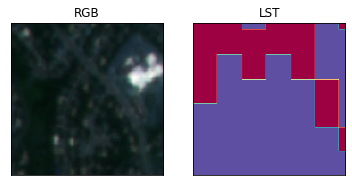

1_training_boulder_summer_stacked_1_3.tif


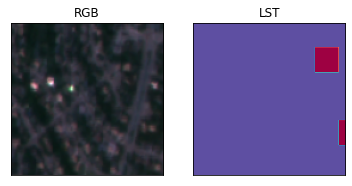

1_training_boulder_summer_stacked_1_4.tif


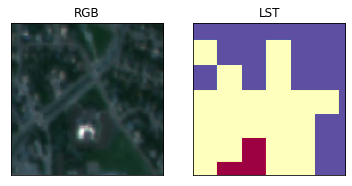

1_training_boulder_summer_stacked_1_5.tif


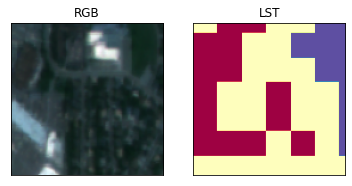

1_training_boulder_summer_stacked_2_1.tif


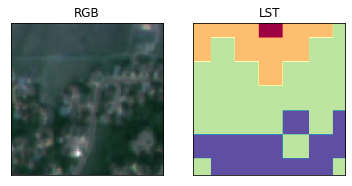

1_training_boulder_summer_stacked_2_2.tif


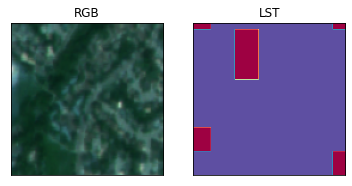

1_training_boulder_summer_stacked_2_3.tif


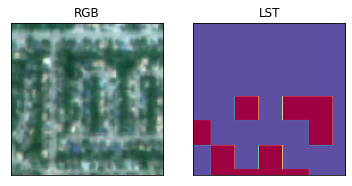

1_training_boulder_summer_stacked_2_4.tif


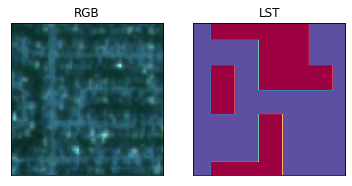

1_training_boulder_summer_stacked_2_5.tif


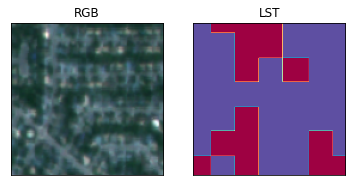

1_training_boulder_summer_stacked_3_1.tif


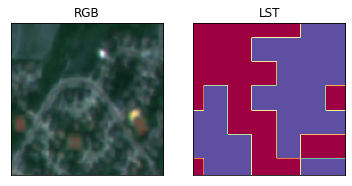

1_training_boulder_summer_stacked_3_2.tif


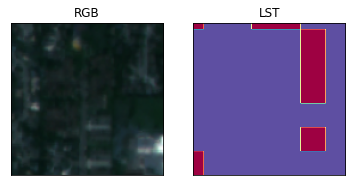

1_training_boulder_summer_stacked_3_3.tif


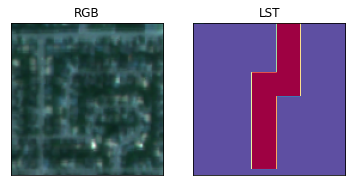

1_training_boulder_summer_stacked_3_4.tif


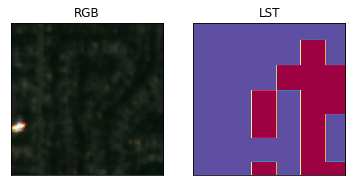

1_training_boulder_summer_stacked_3_5.tif


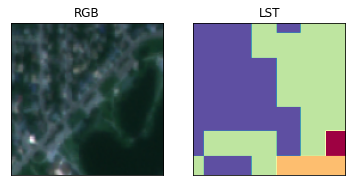

1_training_boulder_summer_stacked_4_1.tif


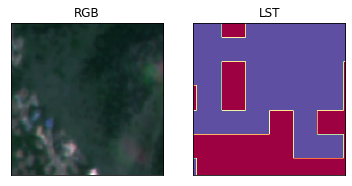

1_training_boulder_summer_stacked_4_2.tif


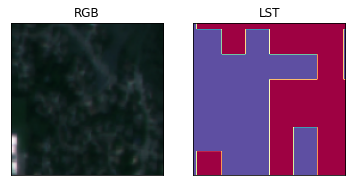

1_training_boulder_summer_stacked_4_3.tif


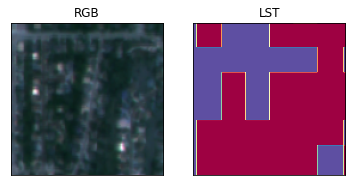

1_training_boulder_summer_stacked_4_4.tif


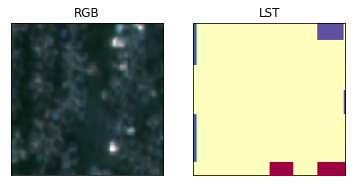

1_training_boulder_summer_stacked_4_5.tif


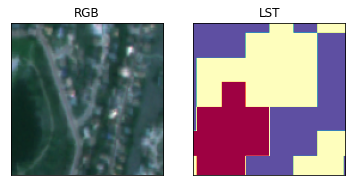

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_summer_stacked_1_1.tif


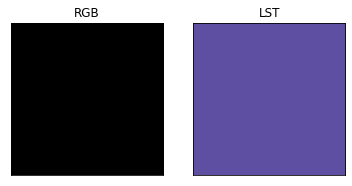

2_training_boulder_summer_stacked_1_2.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


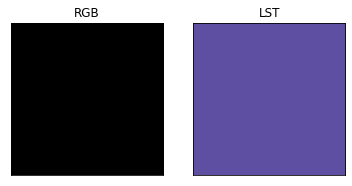

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_summer_stacked_1_3.tif


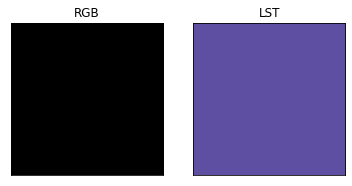

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_summer_stacked_1_4.tif


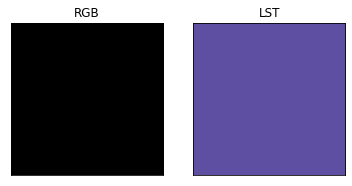

2_training_boulder_summer_stacked_1_5.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


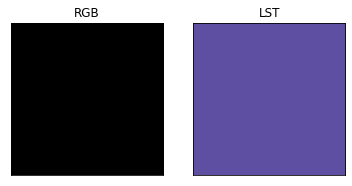

2_training_boulder_summer_stacked_2_1.tif


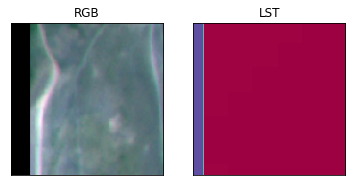

2_training_boulder_summer_stacked_2_2.tif


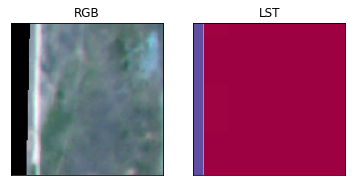

2_training_boulder_summer_stacked_2_3.tif


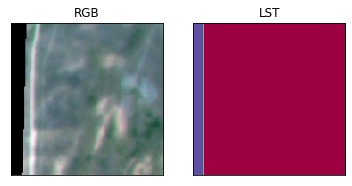

2_training_boulder_summer_stacked_2_4.tif


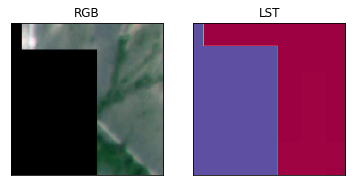

2_training_boulder_summer_stacked_2_5.tif


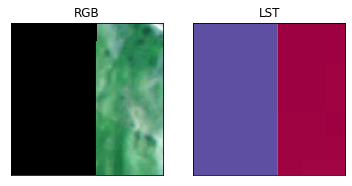

2_training_boulder_summer_stacked_3_1.tif


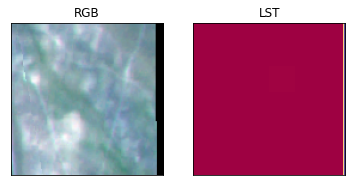

2_training_boulder_summer_stacked_3_2.tif


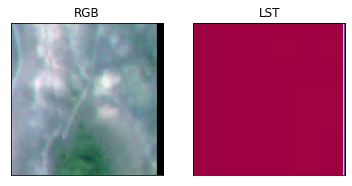

2_training_boulder_summer_stacked_3_3.tif


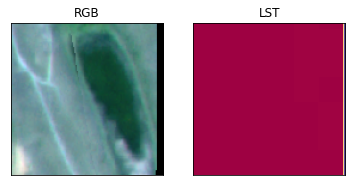

2_training_boulder_summer_stacked_3_4.tif


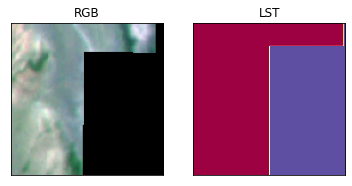

2_training_boulder_summer_stacked_3_5.tif


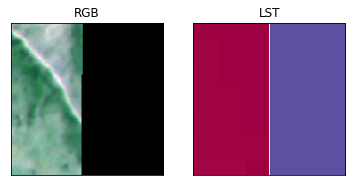

2_training_boulder_summer_stacked_4_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


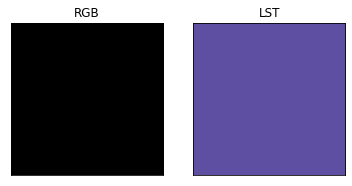

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_summer_stacked_4_2.tif


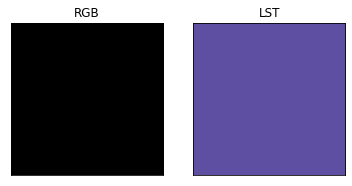

2_training_boulder_summer_stacked_4_3.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


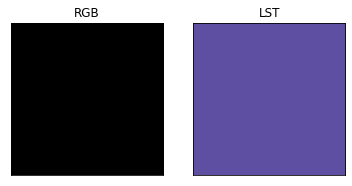

2_training_boulder_summer_stacked_4_4.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


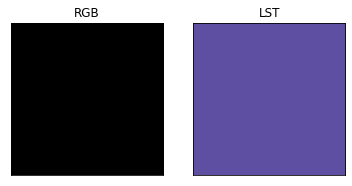

2_training_boulder_summer_stacked_4_5.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


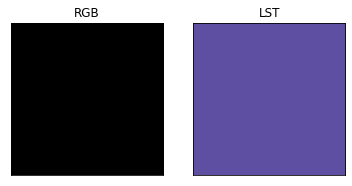

3_training_boulder_summer_stacked_1_1.tif


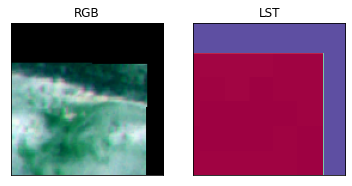

3_training_boulder_summer_stacked_1_2.tif


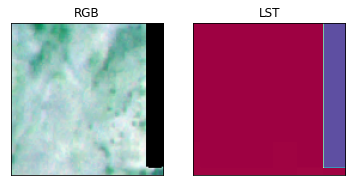

3_training_boulder_summer_stacked_1_3.tif


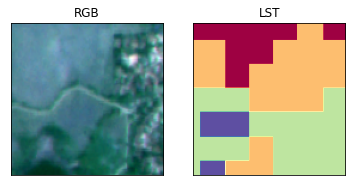

3_training_boulder_summer_stacked_1_4.tif


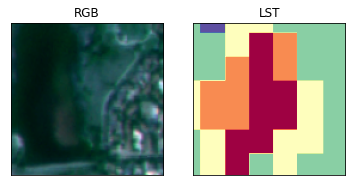

3_training_boulder_summer_stacked_1_5.tif


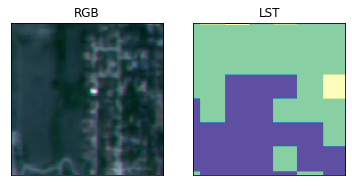

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_summer_stacked_2_1.tif


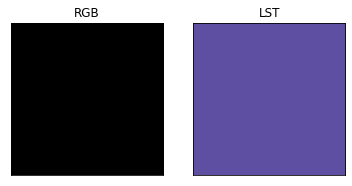

3_training_boulder_summer_stacked_2_2.tif


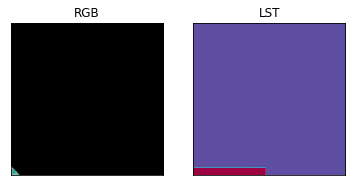

3_training_boulder_summer_stacked_2_3.tif


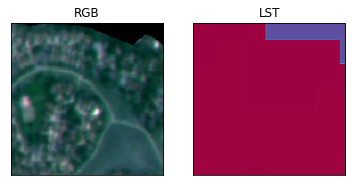

3_training_boulder_summer_stacked_2_4.tif


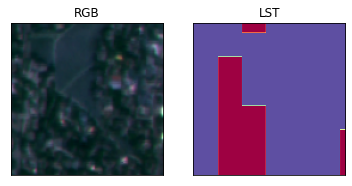

3_training_boulder_summer_stacked_2_5.tif


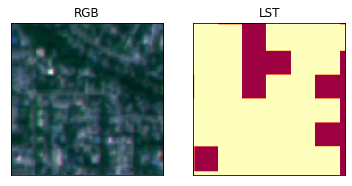

3_training_boulder_summer_stacked_3_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


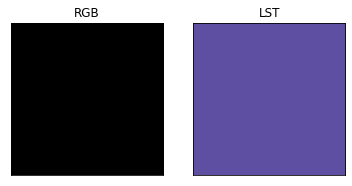

3_training_boulder_summer_stacked_3_2.tif


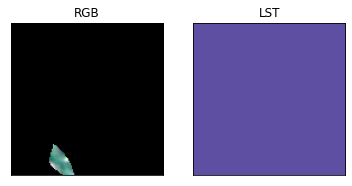

3_training_boulder_summer_stacked_3_3.tif


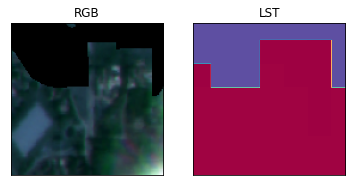

3_training_boulder_summer_stacked_3_4.tif


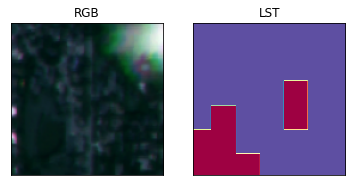

3_training_boulder_summer_stacked_3_5.tif


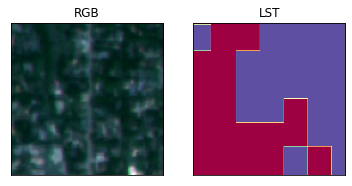

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_summer_stacked_4_1.tif


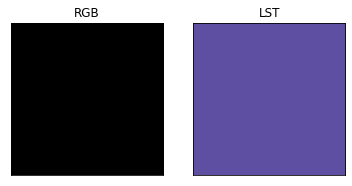

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3_training_boulder_summer_stacked_4_2.tif


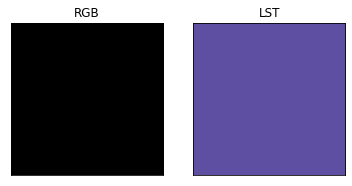

3_training_boulder_summer_stacked_4_3.tif


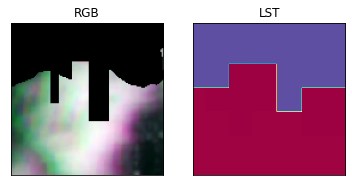

3_training_boulder_summer_stacked_4_4.tif


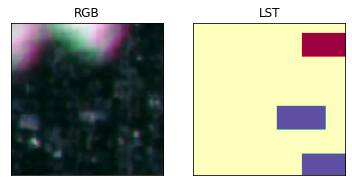

3_training_boulder_summer_stacked_4_5.tif


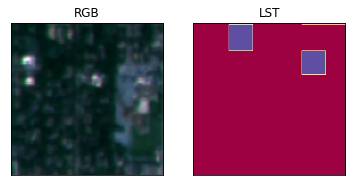

4_training_boulder_summer_stacked_1_1.tif


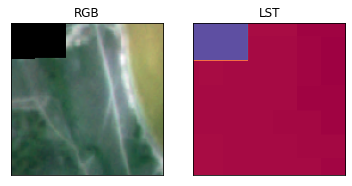

4_training_boulder_summer_stacked_1_2.tif


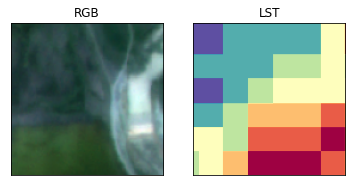

4_training_boulder_summer_stacked_1_3.tif


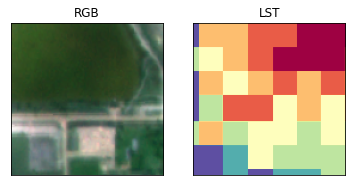

4_training_boulder_summer_stacked_1_4.tif


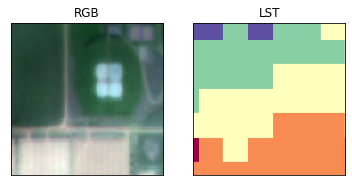

4_training_boulder_summer_stacked_1_5.tif


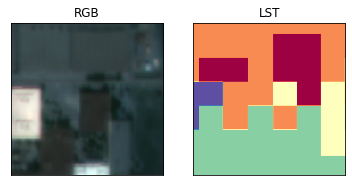

4_training_boulder_summer_stacked_2_1.tif


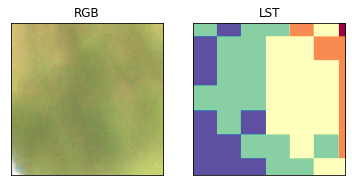

4_training_boulder_summer_stacked_2_2.tif


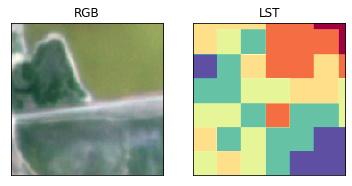

4_training_boulder_summer_stacked_2_3.tif


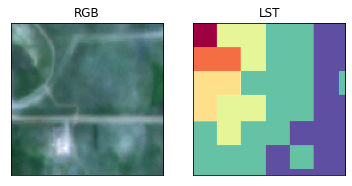

4_training_boulder_summer_stacked_2_4.tif


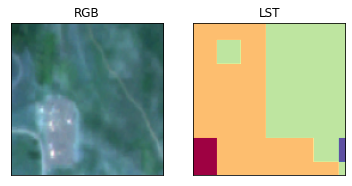

4_training_boulder_summer_stacked_2_5.tif


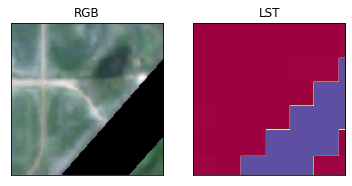

4_training_boulder_summer_stacked_3_1.tif


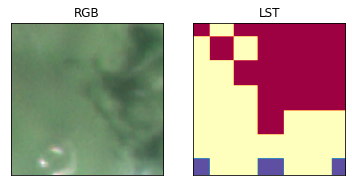

4_training_boulder_summer_stacked_3_2.tif


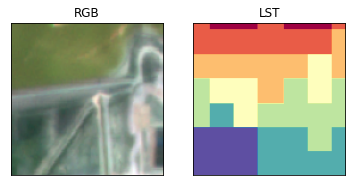

4_training_boulder_summer_stacked_3_3.tif


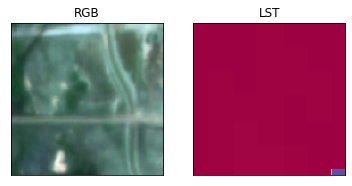

4_training_boulder_summer_stacked_3_4.tif


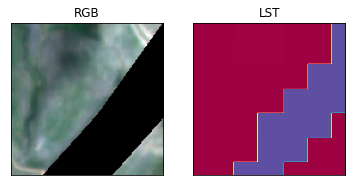

4_training_boulder_summer_stacked_3_5.tif


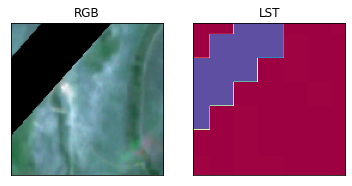

4_training_boulder_summer_stacked_4_1.tif


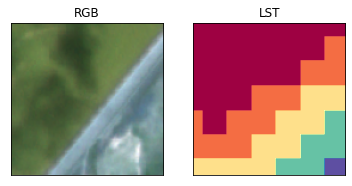

4_training_boulder_summer_stacked_4_2.tif


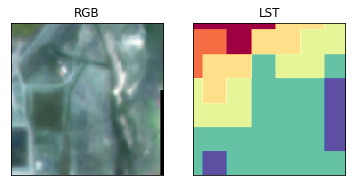

4_training_boulder_summer_stacked_4_3.tif


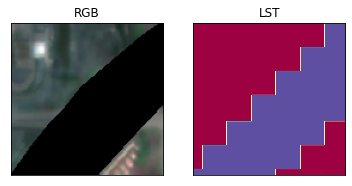

4_training_boulder_summer_stacked_4_4.tif


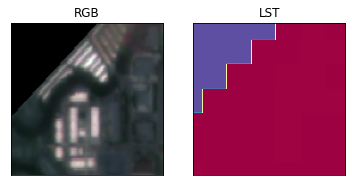

4_training_boulder_summer_stacked_4_5.tif


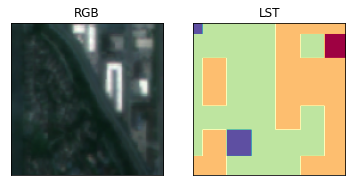

5_training_boulder_summer_stacked_1_1.tif


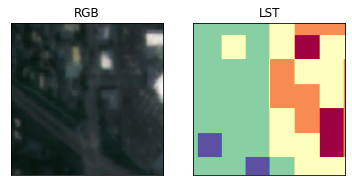

5_training_boulder_summer_stacked_1_2.tif


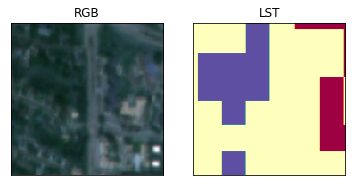

5_training_boulder_summer_stacked_1_3.tif


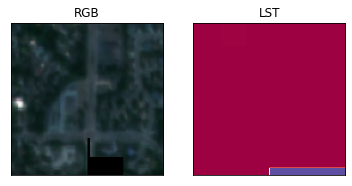

5_training_boulder_summer_stacked_1_4.tif


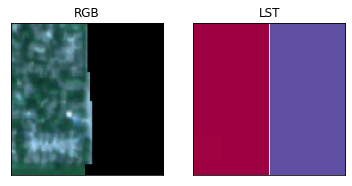

5_training_boulder_summer_stacked_1_5.tif


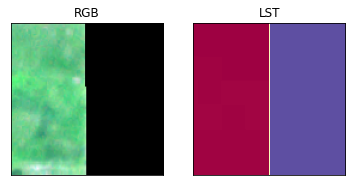

5_training_boulder_summer_stacked_2_1.tif


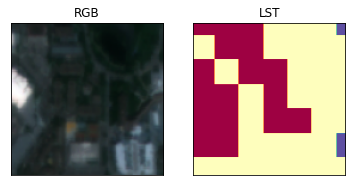

5_training_boulder_summer_stacked_2_2.tif


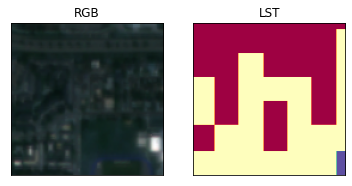

5_training_boulder_summer_stacked_2_3.tif


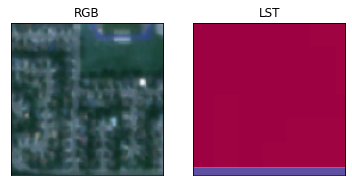

5_training_boulder_summer_stacked_2_4.tif


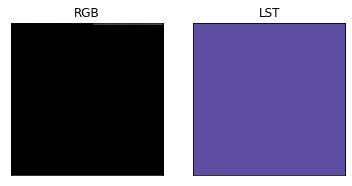

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5_training_boulder_summer_stacked_2_5.tif


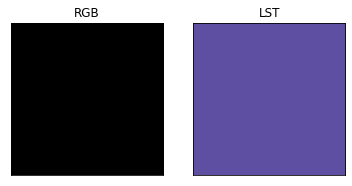

5_training_boulder_summer_stacked_3_1.tif


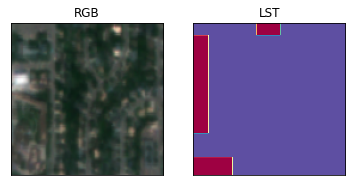

5_training_boulder_summer_stacked_3_2.tif


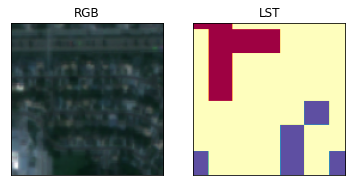

5_training_boulder_summer_stacked_3_3.tif


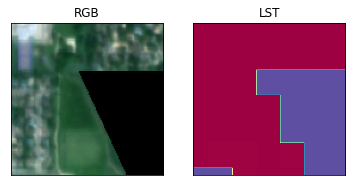

5_training_boulder_summer_stacked_3_4.tif


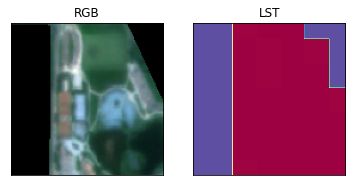

5_training_boulder_summer_stacked_3_5.tif


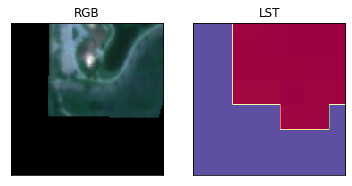

5_training_boulder_summer_stacked_4_1.tif


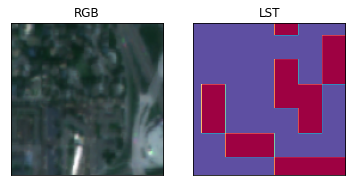

5_training_boulder_summer_stacked_4_2.tif


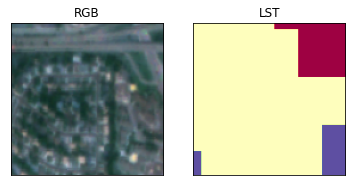

5_training_boulder_summer_stacked_4_3.tif


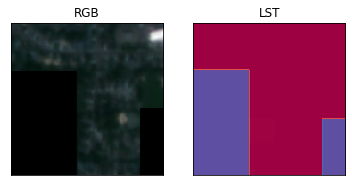

5_training_boulder_summer_stacked_4_4.tif


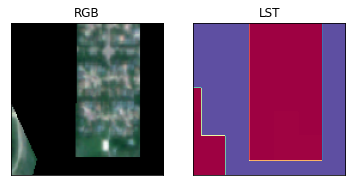

5_training_boulder_summer_stacked_4_5.tif


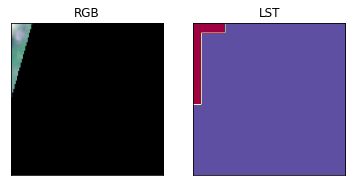

6_training_boulder_summer_stacked_1_1.tif


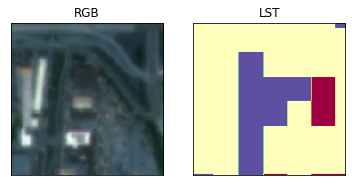

6_training_boulder_summer_stacked_1_2.tif


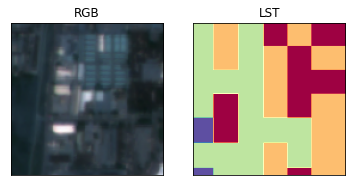

6_training_boulder_summer_stacked_1_3.tif


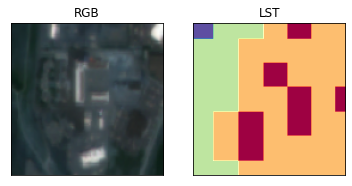

6_training_boulder_summer_stacked_1_4.tif


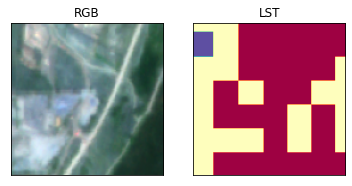

6_training_boulder_summer_stacked_1_5.tif


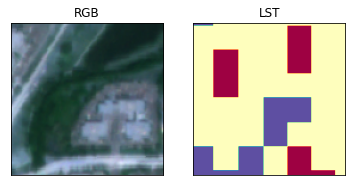

6_training_boulder_summer_stacked_2_1.tif


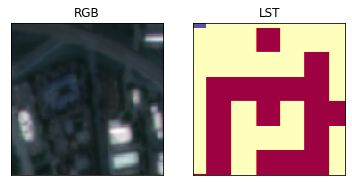

6_training_boulder_summer_stacked_2_2.tif


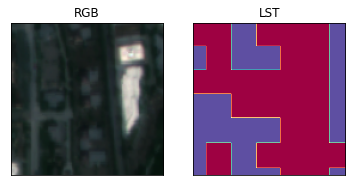

6_training_boulder_summer_stacked_2_3.tif


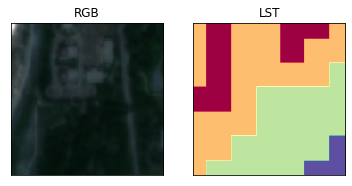

6_training_boulder_summer_stacked_2_4.tif


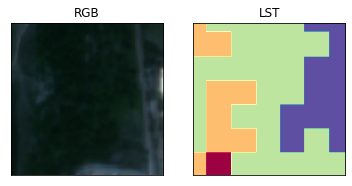

6_training_boulder_summer_stacked_2_5.tif


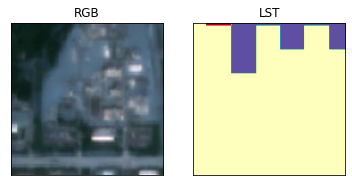

6_training_boulder_summer_stacked_3_1.tif


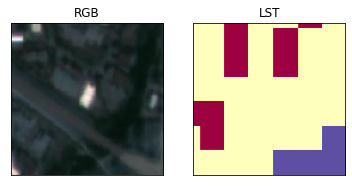

6_training_boulder_summer_stacked_3_2.tif


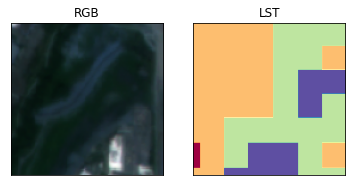

6_training_boulder_summer_stacked_3_3.tif


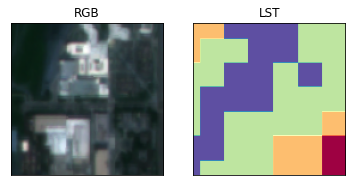

6_training_boulder_summer_stacked_3_4.tif


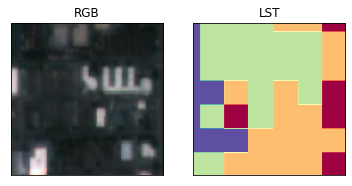

6_training_boulder_summer_stacked_3_5.tif


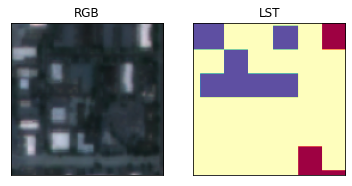

6_training_boulder_summer_stacked_4_1.tif


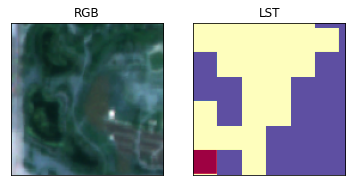

6_training_boulder_summer_stacked_4_2.tif


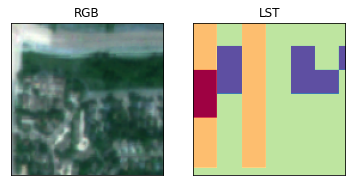

6_training_boulder_summer_stacked_4_3.tif


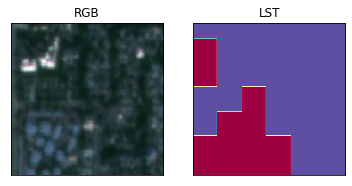

6_training_boulder_summer_stacked_4_4.tif


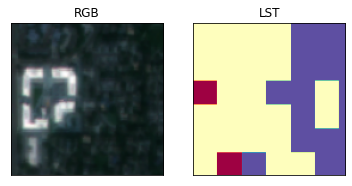

6_training_boulder_summer_stacked_4_5.tif


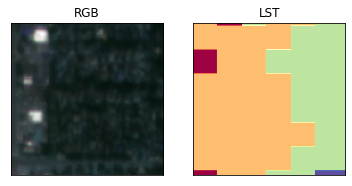

7_training_boulder_summer_stacked_1_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


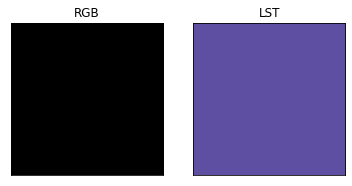

7_training_boulder_summer_stacked_1_2.tif


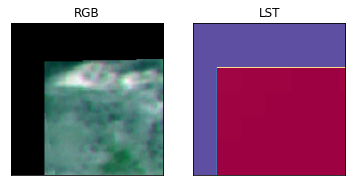

7_training_boulder_summer_stacked_1_3.tif


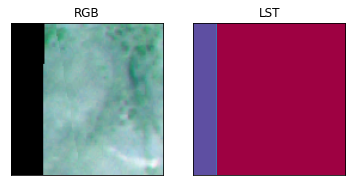

7_training_boulder_summer_stacked_1_4.tif


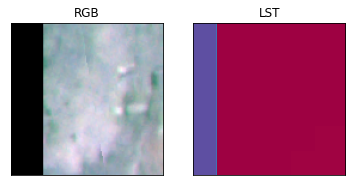

7_training_boulder_summer_stacked_1_5.tif


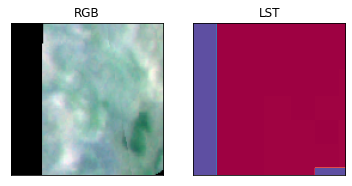

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7_training_boulder_summer_stacked_2_1.tif


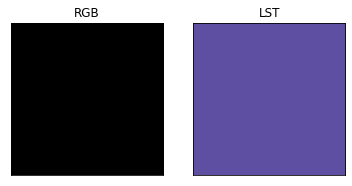

7_training_boulder_summer_stacked_2_2.tif


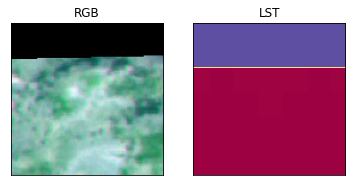

7_training_boulder_summer_stacked_2_3.tif


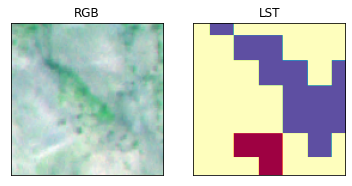

7_training_boulder_summer_stacked_2_4.tif


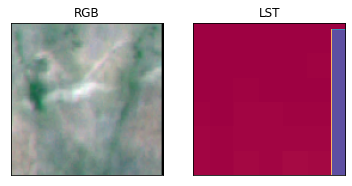

7_training_boulder_summer_stacked_2_5.tif


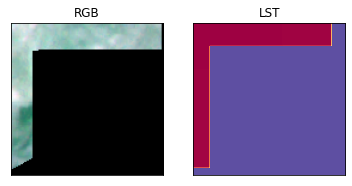

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7_training_boulder_summer_stacked_3_1.tif


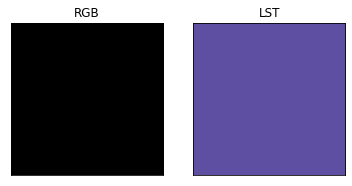

7_training_boulder_summer_stacked_3_2.tif


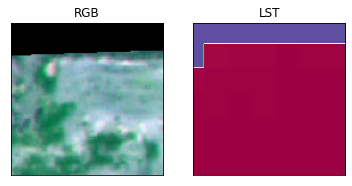

7_training_boulder_summer_stacked_3_3.tif


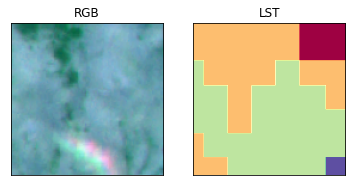

7_training_boulder_summer_stacked_3_4.tif


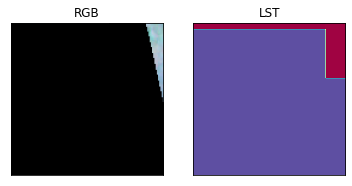

7_training_boulder_summer_stacked_3_5.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


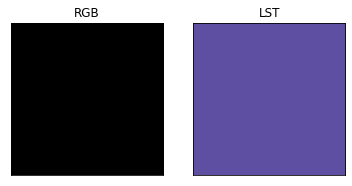

7_training_boulder_summer_stacked_4_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


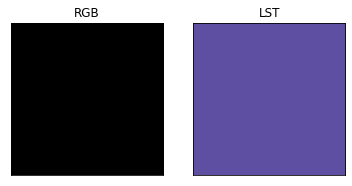

7_training_boulder_summer_stacked_4_2.tif


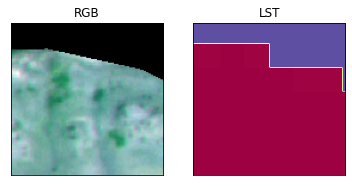

7_training_boulder_summer_stacked_4_3.tif


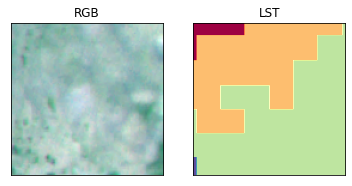

7_training_boulder_summer_stacked_4_4.tif


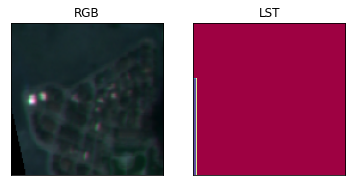

7_training_boulder_summer_stacked_4_5.tif


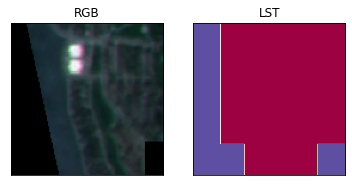

8_training_boulder_summer_stacked_1_1.tif


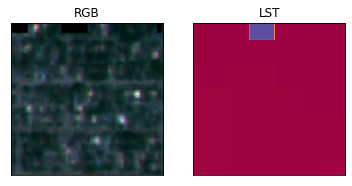

8_training_boulder_summer_stacked_1_2.tif


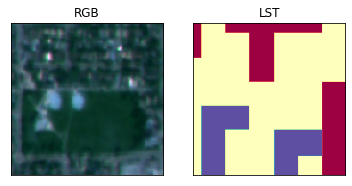

8_training_boulder_summer_stacked_1_3.tif


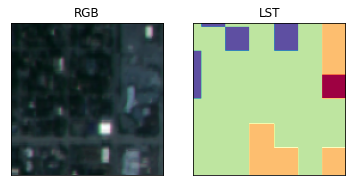

8_training_boulder_summer_stacked_1_4.tif


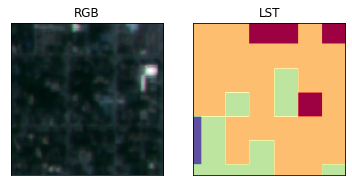

8_training_boulder_summer_stacked_1_5.tif


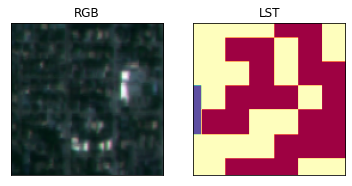

8_training_boulder_summer_stacked_2_1.tif


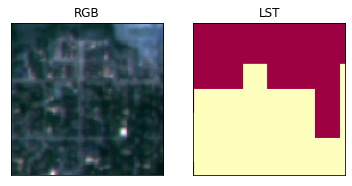

8_training_boulder_summer_stacked_2_2.tif


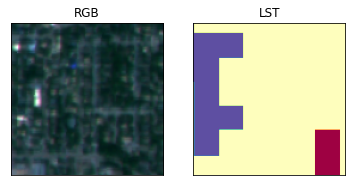

8_training_boulder_summer_stacked_2_3.tif


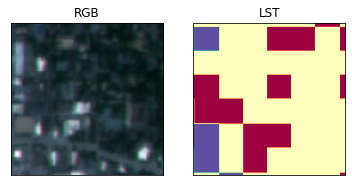

8_training_boulder_summer_stacked_2_4.tif


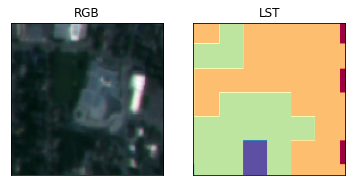

8_training_boulder_summer_stacked_2_5.tif


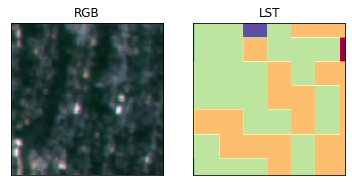

8_training_boulder_summer_stacked_3_1.tif


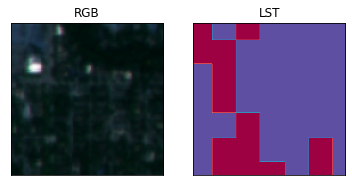

8_training_boulder_summer_stacked_3_2.tif


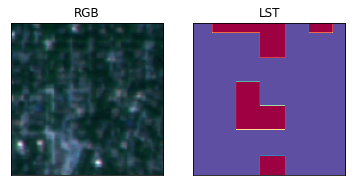

8_training_boulder_summer_stacked_3_3.tif


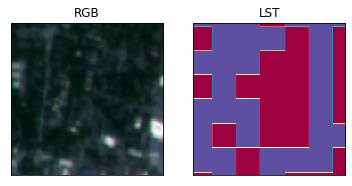

8_training_boulder_summer_stacked_3_4.tif


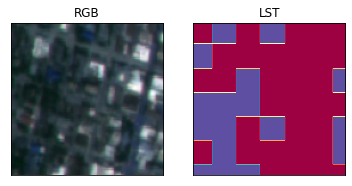

8_training_boulder_summer_stacked_3_5.tif


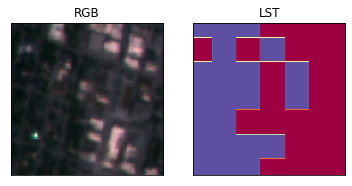

8_training_boulder_summer_stacked_4_1.tif


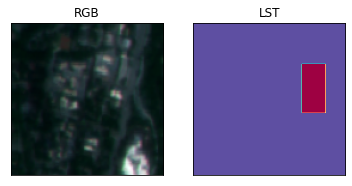

8_training_boulder_summer_stacked_4_2.tif


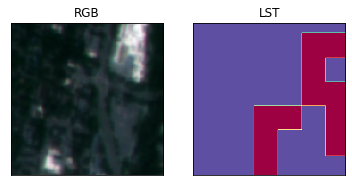

8_training_boulder_summer_stacked_4_3.tif


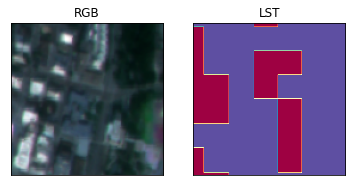

8_training_boulder_summer_stacked_4_4.tif


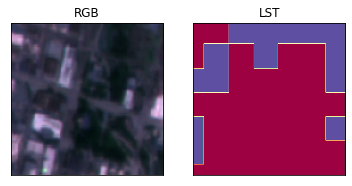

8_training_boulder_summer_stacked_4_5.tif


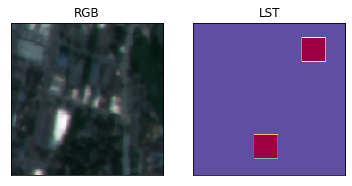

9_training_boulder_summer_stacked_1_1.tif


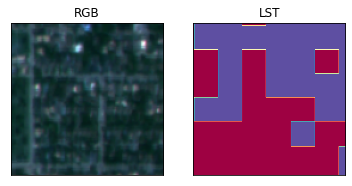

9_training_boulder_summer_stacked_1_2.tif


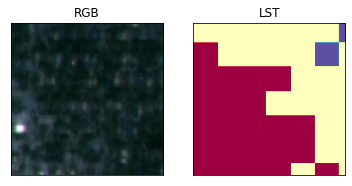

9_training_boulder_summer_stacked_1_3.tif


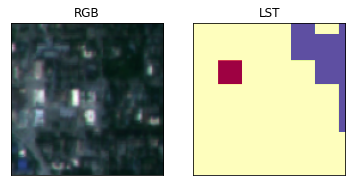

9_training_boulder_summer_stacked_1_4.tif


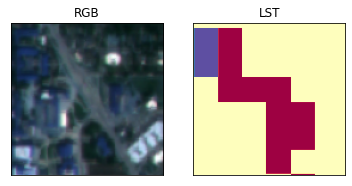

9_training_boulder_summer_stacked_1_5.tif


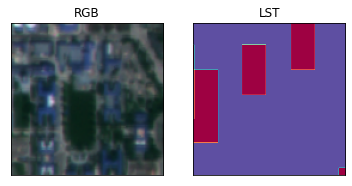

9_training_boulder_summer_stacked_2_1.tif


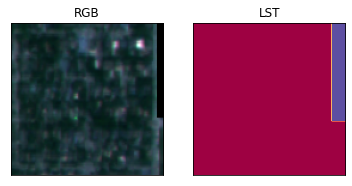

9_training_boulder_summer_stacked_2_2.tif


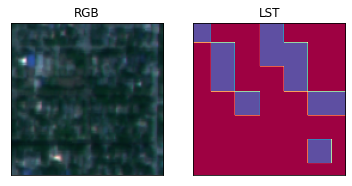

9_training_boulder_summer_stacked_2_3.tif


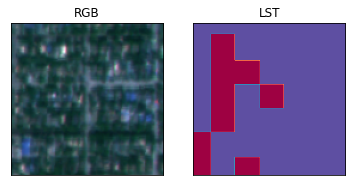

9_training_boulder_summer_stacked_2_4.tif


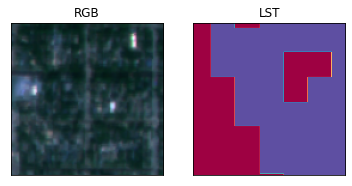

9_training_boulder_summer_stacked_2_5.tif


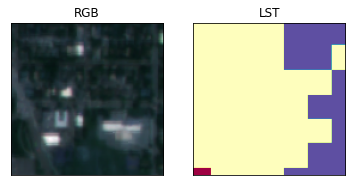

9_training_boulder_summer_stacked_3_1.tif


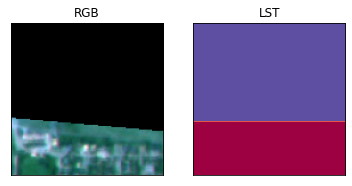

9_training_boulder_summer_stacked_3_2.tif


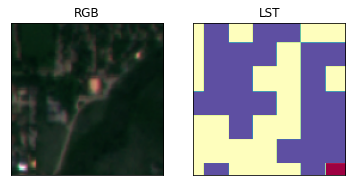

9_training_boulder_summer_stacked_3_3.tif


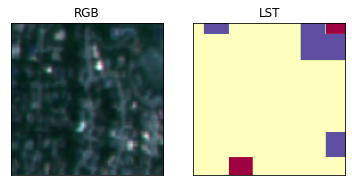

9_training_boulder_summer_stacked_3_4.tif


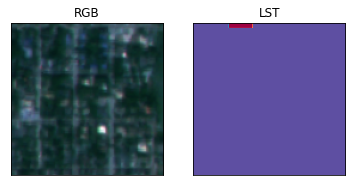

9_training_boulder_summer_stacked_3_5.tif


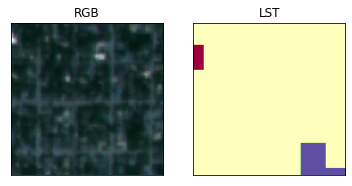

9_training_boulder_summer_stacked_4_1.tif


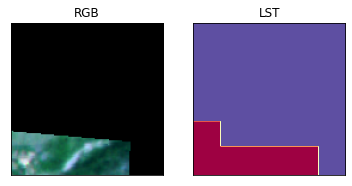

9_training_boulder_summer_stacked_4_2.tif


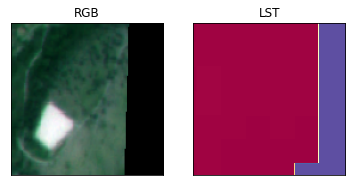

9_training_boulder_summer_stacked_4_3.tif


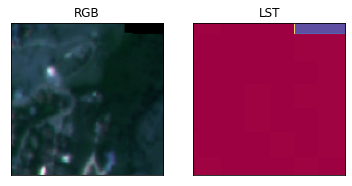

9_training_boulder_summer_stacked_4_4.tif


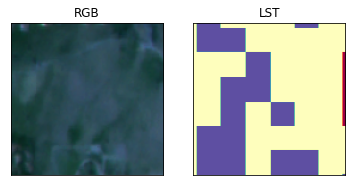

9_training_boulder_summer_stacked_4_5.tif


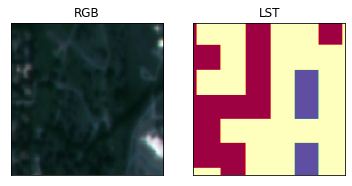

0_training_boulder_fall_stacked_1_1.tif


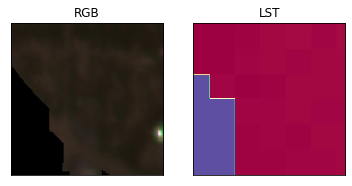

0_training_boulder_fall_stacked_1_2.tif


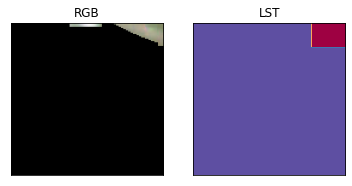

0_training_boulder_fall_stacked_1_3.tif


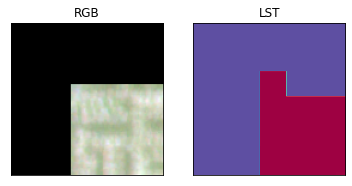

0_training_boulder_fall_stacked_1_4.tif


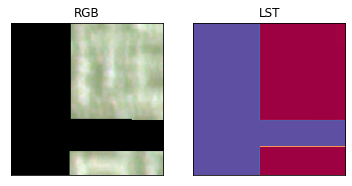

0_training_boulder_fall_stacked_1_5.tif


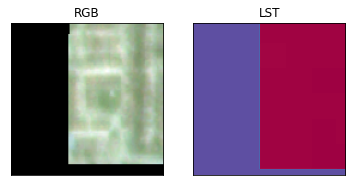

0_training_boulder_fall_stacked_2_1.tif


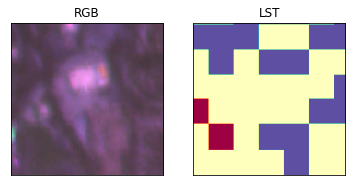

0_training_boulder_fall_stacked_2_2.tif


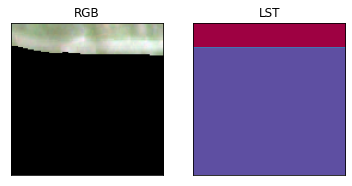

0_training_boulder_fall_stacked_2_4.tif


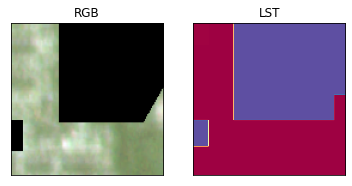

0_training_boulder_fall_stacked_2_5.tif


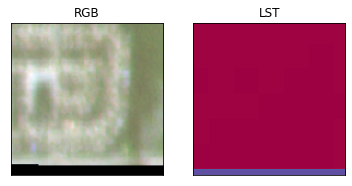

0_training_boulder_fall_stacked_2_6.tif


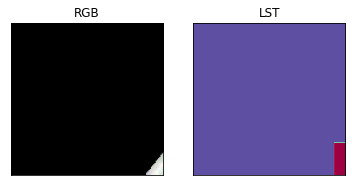

0_training_boulder_fall_stacked_3_1.tif


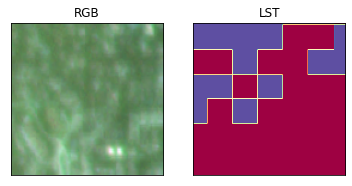

0_training_boulder_fall_stacked_3_2.tif


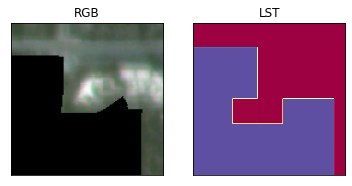

0_training_boulder_fall_stacked_3_3.tif


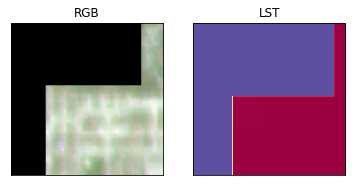

0_training_boulder_fall_stacked_3_4.tif


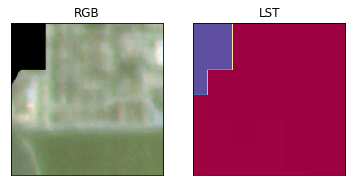

0_training_boulder_fall_stacked_3_5.tif


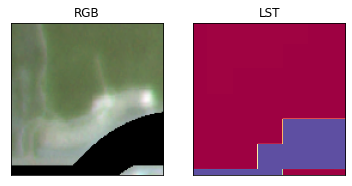

0_training_boulder_fall_stacked_3_6.tif


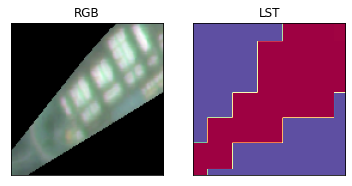

0_training_boulder_fall_stacked_4_1.tif


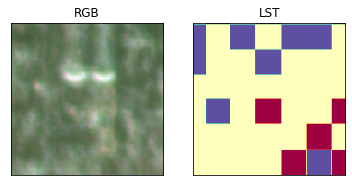

0_training_boulder_fall_stacked_4_2.tif


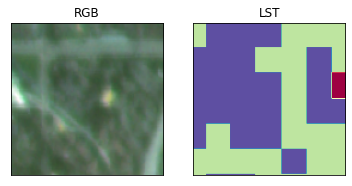

0_training_boulder_fall_stacked_4_3.tif


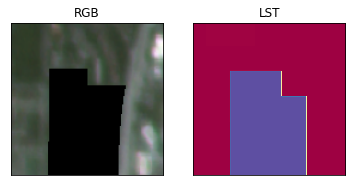

0_training_boulder_fall_stacked_4_4.tif


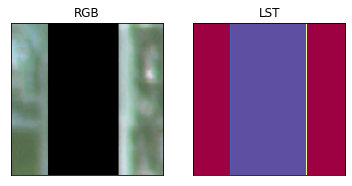

0_training_boulder_fall_stacked_4_5.tif


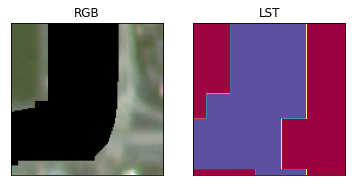

0_training_boulder_fall_stacked_4_6.tif


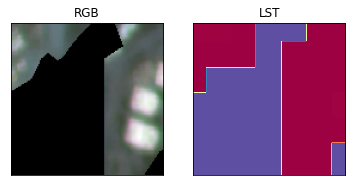

1_training_boulder_fall_stacked_1_1.tif


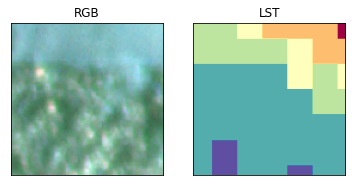

1_training_boulder_fall_stacked_1_2.tif


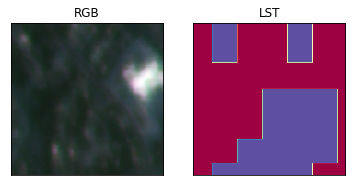

1_training_boulder_fall_stacked_1_3.tif


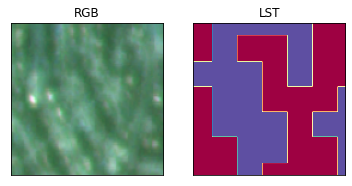

1_training_boulder_fall_stacked_1_4.tif


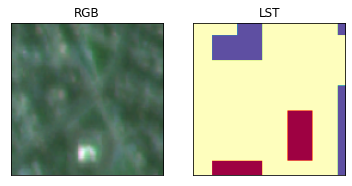

1_training_boulder_fall_stacked_1_5.tif


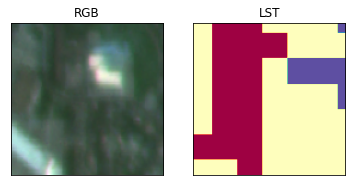

1_training_boulder_fall_stacked_1_6.tif


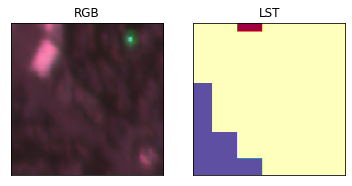

1_training_boulder_fall_stacked_2_1.tif


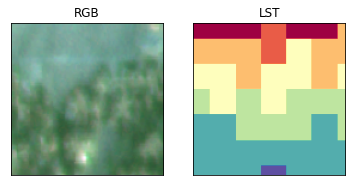

1_training_boulder_fall_stacked_2_2.tif


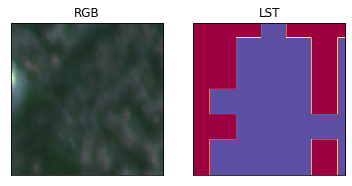

1_training_boulder_fall_stacked_2_3.tif


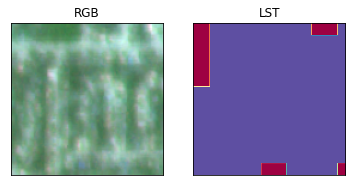

1_training_boulder_fall_stacked_2_4.tif


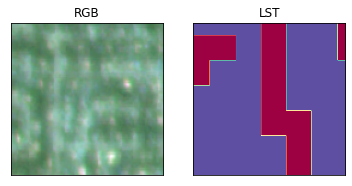

1_training_boulder_fall_stacked_2_5.tif


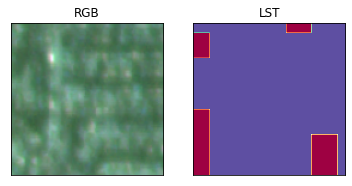

1_training_boulder_fall_stacked_2_6.tif


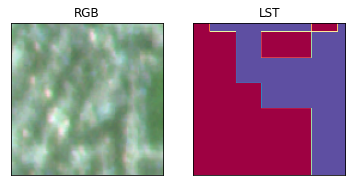

1_training_boulder_fall_stacked_3_1.tif


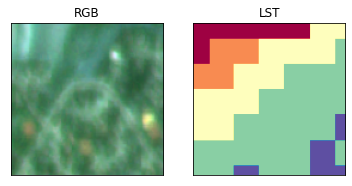

1_training_boulder_fall_stacked_3_2.tif


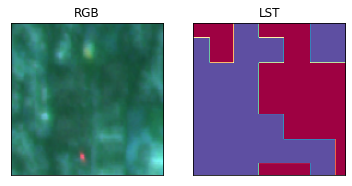

1_training_boulder_fall_stacked_3_3.tif


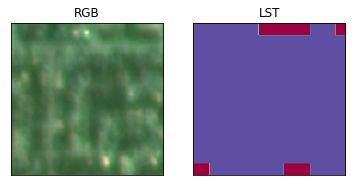

1_training_boulder_fall_stacked_3_4.tif


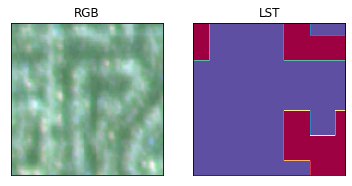

1_training_boulder_fall_stacked_3_5.tif


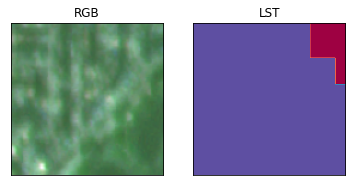

1_training_boulder_fall_stacked_3_6.tif


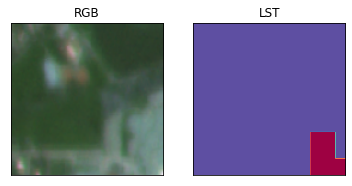

1_training_boulder_fall_stacked_4_1.tif


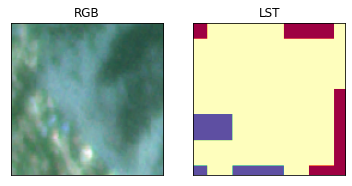

1_training_boulder_fall_stacked_4_2.tif


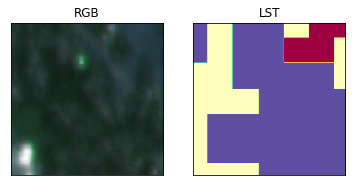

1_training_boulder_fall_stacked_4_3.tif


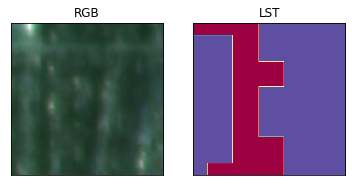

1_training_boulder_fall_stacked_4_4.tif


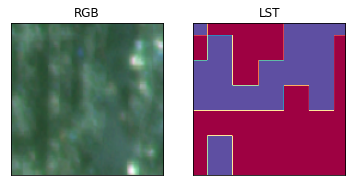

1_training_boulder_fall_stacked_4_5.tif


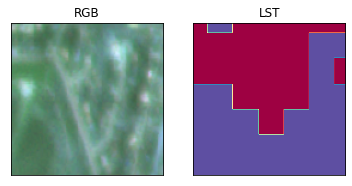

1_training_boulder_fall_stacked_4_6.tif


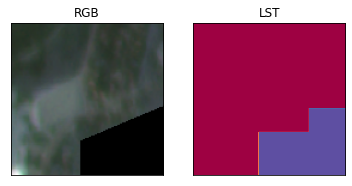

2_training_boulder_fall_stacked_1_1.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


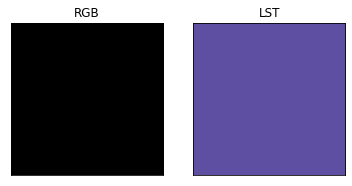

2_training_boulder_fall_stacked_1_2.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


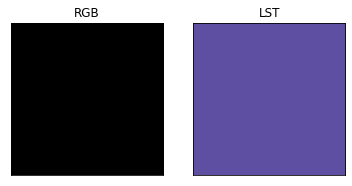

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_fall_stacked_1_3.tif


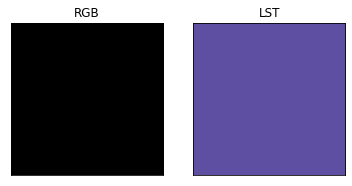

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_fall_stacked_1_4.tif


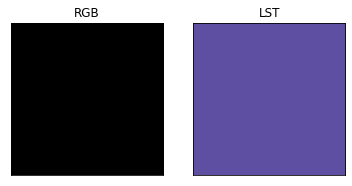

2_training_boulder_fall_stacked_1_5.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


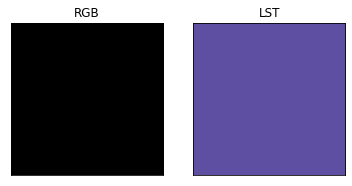

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2_training_boulder_fall_stacked_1_6.tif


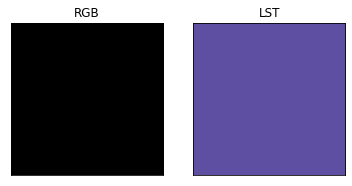

2_training_boulder_fall_stacked_2_1.tif


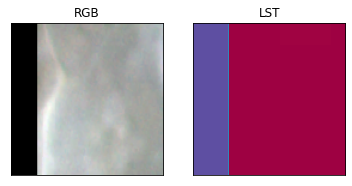

2_training_boulder_fall_stacked_2_2.tif


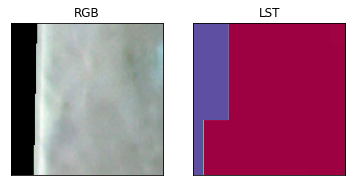

2_training_boulder_fall_stacked_2_3.tif


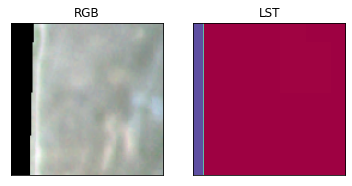

2_training_boulder_fall_stacked_2_4.tif


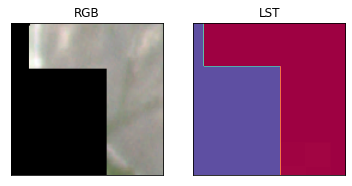

2_training_boulder_fall_stacked_2_5.tif


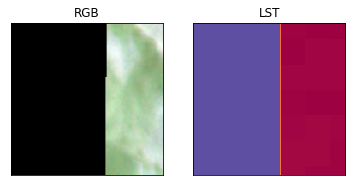

2_training_boulder_fall_stacked_2_6.tif


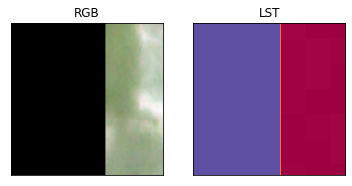

2_training_boulder_fall_stacked_3_1.tif


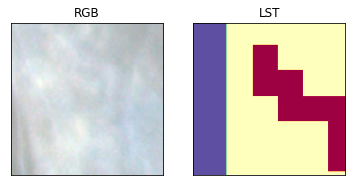

2_training_boulder_fall_stacked_3_2.tif


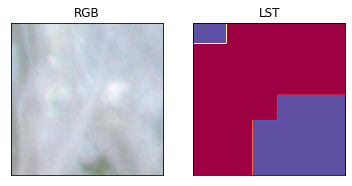

2_training_boulder_fall_stacked_3_3.tif


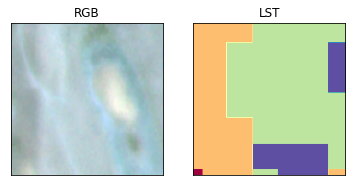

2_training_boulder_fall_stacked_3_4.tif


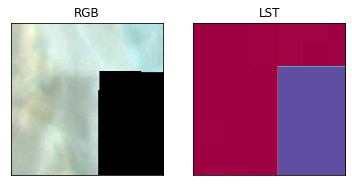

2_training_boulder_fall_stacked_3_5.tif


KeyboardInterrupt: 

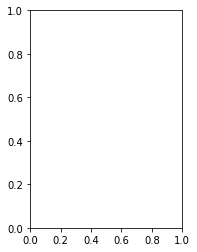

In [7]:
## Re-import buffered + tiled training imagery for visualization/quality check
loc_key_list = ['boulder'] #['austin', 'boulder', 'chicago', 'dc', 'la']
season_key_list = ['spring', 'summer', 'fall'] #['spring', 'summer', 'fall', 'winter']
size = 128
tif_path = '/Volumes/pangan/Training_Data_Clip/Retiled_128/'

for loc_key in loc_key_list: # Iterate through target cities 
    for season_key in season_key_list: # Iterate through seasons 
        tif_list = glob.glob(tif_path + '*' + loc_key + '_' + season_key + '*.tif')
        tif_list = Tcl().call('lsort', '-dict', tif_list) # Sort tif_list by name & number
        for tif in tif_list: 
            img = gdal.Open(str(tif))
            img_arr = np.array(img.ReadAsArray())
            
            # Check for any tiles that aren't square
            if img_arr.shape[1] != size or img_arr.shape[2] != size: 
                print('FLAG:', str(tif))
            
            # Plot tile for visualization 
            print(str(os.path.basename(tif)))
            plot = 'rgb'
            plot_tiled_data(img_arr, plot)
            